In [45]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
#from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
#from ipynb.fs.full.Plot_PCA_functions import

In [5]:
## ANOTATION DATA
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=0)
telomeres = pd.read_table('/branchinecta/jbazanwilliamson/bin_anotation/telomere_hg38')
centromeres = pd.read_table('/branchinecta/jbazanwilliamson/bin_anotation/centromeres_hg38')
hm3_cnv_data = pd.read_table('/branchinecta/jbazanwilliamson/hm3_cnv_submission.txt')
header_list = ['SAMPLE_NAME','TYPE', 'POSITION', 'LENGHT', 'RD', 'T-TEST-EVAL', 'GAUSSIAN-EVAL', 'T-TEST-EVAL(MIDDLE)','GAUSSIAN-EVAL(MIDDLE)', 'FRAQ-READ-QUALITY' ]
cnvnator_data = pd.read_table('/branchinecta/jbazanwilliamson/CNVnator/CNVnator_results.txt', names=header_list)
telomeres['chrom'] = telomeres['chrom'].str.replace('chr', '')

anotation_cnvnator = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

centromeres['chrom'] = centromeres['chrom'].str.replace('chr', '')

black_header = ['chr','start', 'end']
blacklist = pd.read_table('/branchinecta/jbazanwilliamson/bin_anotation/ENCFF356LFX.bed', names=black_header)
blacklist['chr'] = blacklist['chr'].str.replace('chr', '')
black_header = ['chr','start', 'end', 'type', 'score', 'none']
blacklist_2 = pd.read_table('/branchinecta/jbazanwilliamson/bin_anotation/ENCFF220FIN.bed', names=black_header)
blacklist_2['chr'] = blacklist_2['chr'].str.replace('chr', '')
#Table browser is 0-based coordinates, changed to 1-based for compability with CNV data
telomeres['chromStart'] = telomeres['chromStart'] + 1

centromeres['chromStart'] = centromeres['chromStart'] + 1

hm3_cnv_data['chr'] = hm3_cnv_data['chr'].astype(str)

anotation['10-Region'].value_counts()

#CNVNATOR DATA

anotation_cnvnator = anotation_cnvnator.drop(columns=['4-reich_id', '5-ena_ftp_bam_ptr', '6-Sequencing_Panel', '7-Gender', '8-Population_ID', '9-Contributor', '10-Region', '11-Country', '12-Town', '13-Latitude', '14-Longitude', '15-DNA_Source', '16-BioSamples Accession', '17-Embargo'])

features_cnvnator  = anotation_cnvnator.merge(cnvnator_data , left_index=True, right_index=True)

### WiseconderX data
header_list_wisecondor = ['SAMPLE_NAME', 'CHR', 'START', 'END', 'RATIO', 'ZSCORE',' TYPE']
wisecondor_data = pd.read_table('/branchinecta/jbazanwilliamson/wisecondor/results/results.txt', names=header_list_wisecondor)

cnvnator_data

,SAMPLE_NAME,TYPE,POSITION,LENGHT,RD,T-TEST-EVAL,GAUSSIAN-EVAL,T-TEST-EVAL(MIDDLE),GAUSSIAN-EVAL(MIDDLE),FRAQ-READ-QUALITY
0,LP6005441-DNA_A01,deletion,1:1-10000,10000.0,0.000000,1.593730e-11,0.000000e+00,1.992160e-11,0.000000e+00,-1
1,LP6005441-DNA_A01,duplication,1:11601-18400,6800.0,1.885520,0.000000e+00,2.870330e+09,1.644770e-04,2.870520e+09,1
2,LP6005441-DNA_A01,deletion,1:39901-48200,8300.0,0.491248,1.920150e-11,1.170970e+04,2.529720e-11,2.329250e+05,1
3,LP6005441-DNA_A01,deletion,1:49001-49700,700.0,0.440000,1.171230e+02,1.951650e-05,1.000000e+00,1.000000e+00,1
4,LP6005441-DNA_A01,deletion,1:51201-64200,13000.0,0.269762,1.225940e-11,7.811940e+03,1.448840e-11,5.609900e+04,1
...,...,...,...,...,...,...,...,...,...,...
2652100,SS6004480,duplication,hs37d5:35449101-35452500,3400.0,6.142330,1.571380e-02,8.098350e-02,2.307510e+01,1.300360e+05,1
2652101,SS6004480,duplication,hs37d5:35453501-35458700,5200.0,5.218620,6.135840e-08,1.654080e+09,1.479150e-03,2.411220e-98,1
2652102,SS6004480,deletion,hs37d5:35459001-35460200,1200.0,0.370035,2.871320e-01,3.368600e-05,1.000000e+00,1.000000e+00,1
2652103,SS6004480,deletion,hs37d5:35463501-35464600,1100.0,0.507767,8.729140e-01,4.879000e-04,1.000000e+00,1.000000e+00,1


In [6]:
def read_vcf_files(vcf_files):
    """
    Read the path of vcf files to a dataframe.

    :param str vcf_file: Path to a vcf files.
    :return: dict of lists of vcf records
    :rtype: dict
    """
    files = glob.glob(vcf_files+'*.vcf')
    vcf_list = []
    for file in files:
        #return pd.DataFrame(read_vcf(file))
        vcf_list.append(read_vcf(file))
    
    return (vcf_list)
    

def read_vcf(vcf_file):
    """
    Read a vcf file to a dict of lists.

    :param str vcf_file: Path to a vcf file.
    :return: dict of lists of vcf records
    :rtype: dict
    """
    vcf_dict = []
    #df = pd.DataFrame()
    with open(vcf_file, 'r') as invcf:
        for line in invcf:
            if line.startswith('#'):
                continue
            line = line.strip().split()
            name = str(vcf_file.split('/')[4])
            name_2 = str(name.split('.')[0])
            CHR = line[0]
            START = line[1]
            INFO = str(line[7].split(';'))
            INFO = INFO.split('=')
            #INFO = INFO.split(',')
            END = INFO
            
        
            #vcf_dict.append((name_2,line[0], line[1], END))
            
            
            vcf_dict.append([name_2,line[0], line[1], line[7], line[9]])
            
    return vcf_dict

In [ ]:
df = read_vcf_files('/branchinecta/jbazanwilliamson/QDNASEQ_5K/')
df

Output = []
  
# Using iteration
for temp in df:
    for elem in temp:
        Output.append(elem)

pd.DataFrame(Output)

In [76]:
df = pd.DataFrame(Output)
info = df[3].str.split(';', expand=True)


end = info[1].str.split('=', expand=True)
end = end[1]


size = info[2].str.split('=', expand=True)
size = size[1]

score = info[4].str.split('=', expand=True)
score = score[1]

log2 = info[5].str.split('=', expand=True)
log2 = log2[1]

In [77]:
qdnaseq_df = pd.DataFrame()
qdnaseq_df['SAMPLE'] = df[0]
qdnaseq_df['CHR'] = df[1]
qdnaseq_df['START'] = df[2].astype(int)
qdnaseq_df['END'] = end.astype(int)
qdnaseq_df['SIZE'] = size.astype(int)
qdnaseq_df['SCORE'] = score
qdnaseq_df['LOG2'] = log2.astype(float)


#CHANGING to HAPMAP format


qdnaseq_df['SCORE'].replace('-2', 'DELETION', inplace=True)
qdnaseq_df['SCORE'].replace('-1', 'DELETION', inplace=True)
qdnaseq_df['SCORE'].replace('1', 'DUPLICATION', inplace=True)
qdnaseq_df['SCORE'].replace('2', 'DUPLICATION', inplace=True)
qdnaseq_df['SCORE'].replace('3', 'DUPLICATION', inplace=True)

qdnaseq_df['TYPE'] = score
qdnaseq_df['TYPE'].replace('-2', 0, inplace=True)
qdnaseq_df['TYPE'].replace('-1', 1, inplace=True)
qdnaseq_df['TYPE'].replace('1', 3, inplace=True)
qdnaseq_df['TYPE'].replace('2', 4, inplace=True)
qdnaseq_df['TYPE'].replace('3', 5, inplace=True)


qdnaseq_df



,SAMPLE,CHR,START,END,SIZE,SCORE,LOG2,TYPE
0,SAMEA3302831,15,82300001,82550000,250000,DELETION,-0.79,1
1,SAMEA3302831,17,45600001,46300000,700000,DELETION,-3.05,1
2,SAMEA3302831,X,72750001,72950000,200000,DELETION,-4.78,1
3,SAMEA3302831,X,102250001,102500000,250000,DELETION,-3.50,1
4,SAMEA3302831,Y,2750001,26700000,23950000,DELETION,-11.68,1
...,...,...,...,...,...,...,...,...
1399,SAMEA3302654,22,25350001,25550000,200000,DELETION,-0.81,1
1400,SAMEA3302654,X,72750001,73000000,250000,DELETION,-2.43,1
1401,SAMEA3302654,X,89200001,93050000,3850000,DELETION,-0.38,1
1402,SAMEA3302654,X,102200001,102500000,300000,DELETION,-3.86,1


<h2> Filtration

In [78]:
#Filter by CNV size
#qdnaseq_df = qdnaseq_df.loc[((qdnaseq_df['SIZE'] > 1000000) & (qdnaseq_df['SIZE'] < 5000000)),:]
qdnaseq_df = qdnaseq_df.loc[(qdnaseq_df['SIZE'] < 1000000),:]


#DROP Y AND X CHRs

#FILTERR BY LOG SIGNIFICATION
qdnaseq_df_low = qdnaseq_df[qdnaseq_df.LOG2 < -0.3]
qdnaseq_df_high = qdnaseq_df[qdnaseq_df.LOG2 > 0.3]
qdnaseq_df = pd.concat([qdnaseq_df_high,qdnaseq_df_low])

#Filter by CNV size
#qdnaseq_df = qdnaseq_df.loc[((qdnaseq_df['SIZE'] > 1000000) & (qdnaseq_df['SIZE'] < 5000000)),:]

###########
#FILTER OUT SAMPLES WITH HIGH NUMBER OF CNVS 
qdnaseq_df = qdnaseq_df[qdnaseq_df.groupby("SAMPLE")["SAMPLE"].transform('size') < 100]


samples_with_aberrations = ['SAMEA3302841', 'SAMEA3302787','SAMEA3302646', 'SAMEA3302785']

qdnaseq_df = qdnaseq_df[~qdnaseq_df.SAMPLE.isin(samples_with_aberrations)]

## Filter by chromosomes
qdnaseq_df_x = qdnaseq_df[qdnaseq_df.CHR == 'X']
qdnaseq_df_no_sex_chr = qdnaseq_df[qdnaseq_df.CHR != 'Y']
qdnaseq_df_no_sex_chr = qdnaseq_df_no_sex_chr[qdnaseq_df_no_sex_chr.CHR != 'X']


qdnaseq_df

,SAMPLE,CHR,START,END,SIZE,SCORE,LOG2,TYPE
56,SAMEA3302645,9,87800001,88100000,300000,DUPLICATION,0.55,3
58,SAMEA3302645,16,35250001,35500000,250000,DUPLICATION,0.60,3
69,SAMEA3302653,5,179300001,179500000,200000,DUPLICATION,0.51,3
82,SAMEA3302844,16,35250001,35500000,250000,DUPLICATION,0.48,4
92,SAMEA3302669,3,12600001,12750000,150000,DUPLICATION,0.55,3
...,...,...,...,...,...,...,...,...
1397,SAMEA3302654,15,82300001,82550000,250000,DELETION,-0.80,1
1398,SAMEA3302654,17,45600001,46300000,700000,DELETION,-3.02,1
1399,SAMEA3302654,22,25350001,25550000,200000,DELETION,-0.81,1
1400,SAMEA3302654,X,72750001,73000000,250000,DELETION,-2.43,1


In [79]:
qdnaseq_df[qdnaseq_df.SAMPLE.isin(samples_with_aberrations)]

,SAMPLE,CHR,START,END,SIZE,SCORE,LOG2,TYPE


In [80]:
# To array for loop purposes 

np_data_style = qdnaseq_df.to_numpy()

telomere = telomeres.to_numpy()
centromere = centromeres.to_numpy()

np_hm3 = hm3_cnv_data.to_numpy()

In [81]:
qdnaseq_df['SAMPLE'].value_counts()

SAMEA3302840    8
SAMEA3302694    7
SAMEA3302855    7
SAMEA3302856    7
SAMEA3302862    7
               ..
SAMEA3302666    1
SAMEA3302681    1
SAMEA3302650    1
SAMEA3302647    1
SAMEA3302673    1
Name: SAMPLE, Length: 95, dtype: int64

array([[<AxesSubplot:title={'center':'START'}>,
        <AxesSubplot:title={'center':'END'}>],
       [<AxesSubplot:title={'center':'SIZE'}>,
        <AxesSubplot:title={'center':'LOG2'}>],
       [<AxesSubplot:title={'center':'TYPE'}>, <AxesSubplot:>]],
      dtype=object)

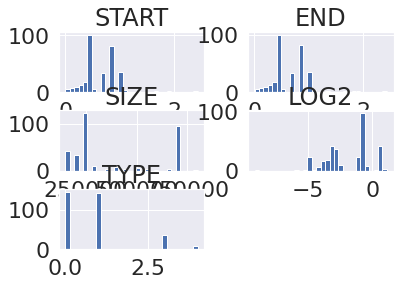

In [82]:
qdnaseq_df.hist(bins=30)

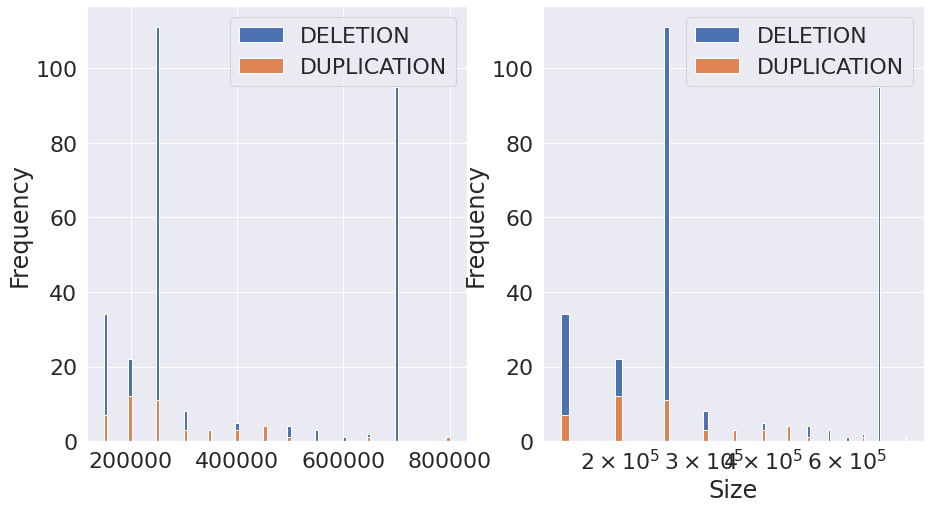

In [83]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
plt.xlabel('Size')

df = qdnaseq_df.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100,legend=True, ax=axs[0]) # alpha for transparency
#plt.xlabel('Size')
plt.xscale('log')

df = qdnaseq_df.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency
#plt.xlabel('Size')
plt.show()

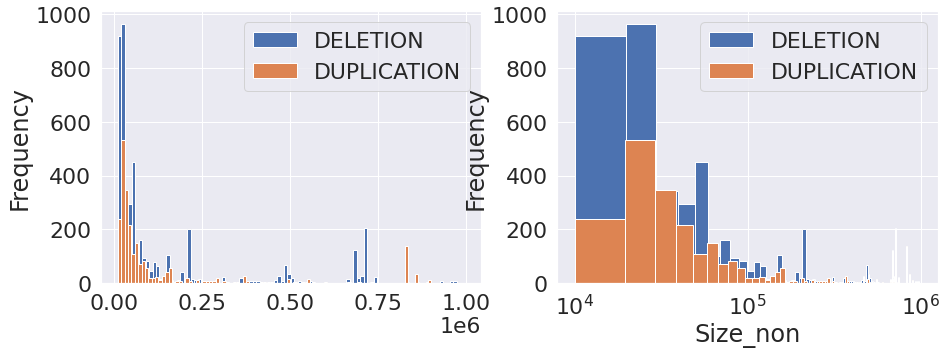

In [55]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100,legend=True, ax=axs[0]) # alpha for transparency
plt.xscale('log')
plt.xlabel('Size')
#plt.show()

df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency
plt.xlabel('Size_non')
plt.show()



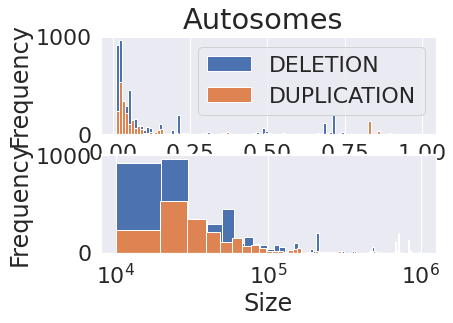

In [56]:
fig, axs = plt.subplots(2)
fig.suptitle('Autosomes')

#fig, axs = plt.subplots(1, 2, figsize=(15, 5))


#plt.show()

df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[1]) # alpha for transparency
plt.xlabel('Size_non')


df = qdnaseq_df_no_sex_chr.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100,legend=True, ax=axs[0]) # alpha for transparency
plt.xscale('log')
plt.xlabel('Size')


plt.show()



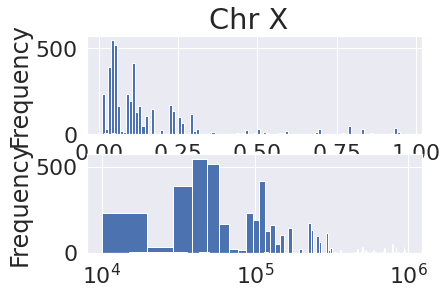

In [57]:
fig, axs = plt.subplots(2)
fig.suptitle('Chr X')

df = qdnaseq_df_x.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df = qdnaseq_df_x.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[1]) # alpha for transparency

plt.show()

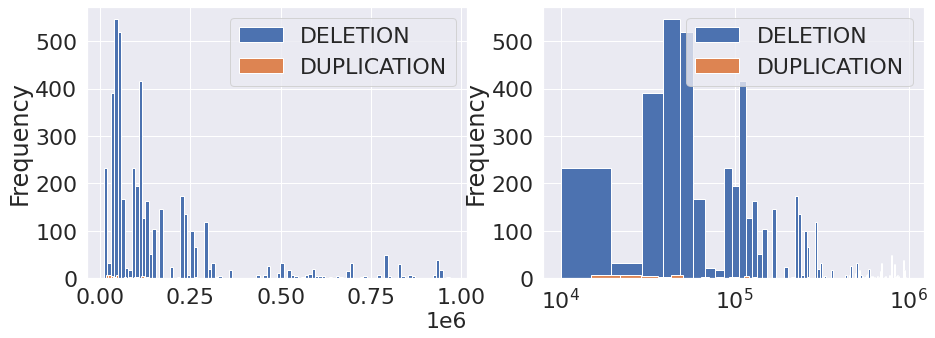

In [58]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

df = qdnaseq_df_x.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0]) # alpha for transparency

plt.xscale('log')
#plt.show()

df = qdnaseq_df_x.groupby(['SCORE'])['SIZE']

df.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1]) # alpha for transparency

plt.show()

In [59]:

#CHANGED TO RD VALUE
#qdnaseq_df['LOG2'] =np.exp(qdnaseq_df['LOG2'])

In [60]:
qdnaseq_df

,SAMPLE,CHR,START,END,SIZE,SCORE,LOG2,TYPE
1,SAMEA3302854,3,75665001,75710000,45000,DUPLICATION,0.90,3
3,SAMEA3302854,4,9010001,9505000,495000,DUPLICATION,0.59,3
4,SAMEA3302854,4,68815001,68855000,40000,DUPLICATION,0.45,3
9,SAMEA3302854,7,2230001,2315000,85000,DUPLICATION,0.58,3
11,SAMEA3302854,7,65795001,65815000,20000,DUPLICATION,0.94,3
...,...,...,...,...,...,...,...,...
21491,SAMEA3302800,X,154145001,154295000,150000,DELETION,-6.55,0
21492,SAMEA3302800,X,154555001,154650000,95000,DELETION,-2.54,0
21493,SAMEA3302800,X,155335001,155385000,50000,DELETION,-6.19,0
21494,SAMEA3302800,X,155455001,155505000,50000,DELETION,-6.15,0


In [61]:
#qdnaseq_df = qdnaseq_df_no_sex_chr
deletions = qdnaseq_df[qdnaseq_df['TYPE'] < 2] 
duplications= qdnaseq_df[qdnaseq_df['TYPE'] > 2] 



In [62]:
qdnaseq_pvt = deletions.pivot_table(index=["CHR", "START", "END"], 
                    columns='SAMPLE', 
                    values='TYPE').reset_index()

qdnaseq_pvt

SAMPLE,CHR,START,END,SAMEA3302610,SAMEA3302611,SAMEA3302612,SAMEA3302613,SAMEA3302614,SAMEA3302615,SAMEA3302616,...,SAMEA3302893,SAMEA3302894,SAMEA3302896,SAMEA3302900,SAMEA3302903,SAMEA3302904,SAMEA3302906,SAMEA3302908,SAMEA3302911,SAMEA3449877
0,1,1445001,1500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1470001,1510000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,1675001,1735000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,6555001,6575000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,12785001,13245000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1603,Y,25070001,25195000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1604,Y,26310001,26675000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1605,Y,26525001,26645000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1606,Y,26630001,26675000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [63]:
### HIGH FREQ CNVS 
freq = qdnaseq_pvt.iloc[:,3:284]
freq_input = freq.rename(columns=anotation['10-Region'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

africa = df[df['Africa'] > 0.50]
america = df[df['America'] > 0.5]
siberia = df[df['CentralAsiaSiberia'] > 0.5]
eastasia = df[df['EastAsia'] > 0.5]
oceania = df[df['Oceania'] > 0.5]
southasia = df[df['SouthAsia'] > 0.5]
euro = df[df['WestEurasia'] > 0.5]

list_high_freq_index = pd.concat([africa, america, siberia, eastasia,oceania, southasia,euro])


ind_list = list(list_high_freq_index.index)
high_freq_african = qdnaseq_pvt.iloc[ind_list]
high_freq_african

SAMPLE,CHR,START,END,SAMEA3302610,SAMEA3302611,SAMEA3302612,SAMEA3302613,SAMEA3302614,SAMEA3302615,SAMEA3302616,...,SAMEA3302893,SAMEA3302894,SAMEA3302896,SAMEA3302900,SAMEA3302903,SAMEA3302904,SAMEA3302906,SAMEA3302908,SAMEA3302911,SAMEA3449877
222,13,18175001,18855000,NaN,0.0,NaN,1.0,NaN,NaN,0.0,...,NaN,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,0.0
242,13,57180001,57200000,NaN,0.0,NaN,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
439,17,36190001,36215000,NaN,0.0,0.0,NaN,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0
449,17,45570001,46280000,NaN,0.0,0.0,1.0,0.0,0.0,0.0,...,NaN,1.0,NaN,0.0,NaN,1.0,0.0,NaN,0.0,0.0
741,3,46755001,46810000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,17,36190001,36215000,NaN,0.0,0.0,NaN,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,NaN,NaN,0.0,0.0
449,17,45570001,46280000,NaN,0.0,0.0,1.0,0.0,0.0,0.0,...,NaN,1.0,NaN,0.0,NaN,1.0,0.0,NaN,0.0,0.0
538,2,34470001,34505000,NaN,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
1160,8,39375001,39525000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,...,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [64]:
counts = high_freq_african.iloc[:,3:283]

counts = counts.fillna(2)

hist = (np.array(counts).flatten())
#seaborn.histplot(hist)
counts 





SAMPLE,SAMEA3302610,SAMEA3302611,SAMEA3302612,SAMEA3302613,SAMEA3302614,SAMEA3302615,SAMEA3302616,SAMEA3302618,SAMEA3302619,SAMEA3302620,...,SAMEA3302893,SAMEA3302894,SAMEA3302896,SAMEA3302900,SAMEA3302903,SAMEA3302904,SAMEA3302906,SAMEA3302908,SAMEA3302911,SAMEA3449877
222,2.0,0.0,2.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,0.0,2.0,2.0,1.0,2.0,2.0,0.0
242,2.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0
439,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,...,1.0,1.0,1.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0
449,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,2.0,0.0,2.0,1.0,0.0,2.0,0.0,0.0
741,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,...,1.0,1.0,1.0,0.0,1.0,1.0,2.0,2.0,0.0,0.0
449,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,2.0,0.0,2.0,1.0,0.0,2.0,0.0,0.0
538,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
1160,2.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,...,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0


/opt/anaconda3/lib/python3.6/site-packages/seaborn/matrix.py:624: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


ValueError: The condensed distance matrix must contain only finite values.

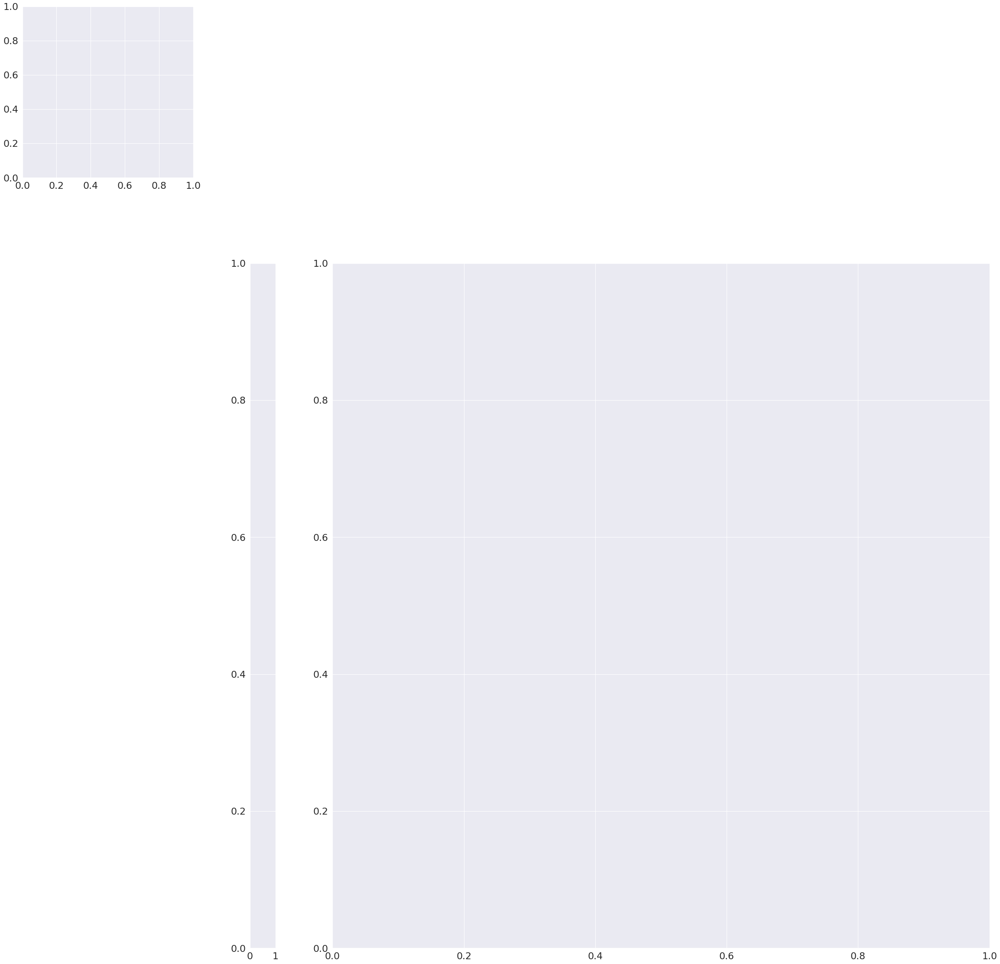

In [65]:
#f, ax = plt.subplots(figsize=(20, 20))

input_matrix = counts.rename(columns=anotation['10-Region'])
corrmatrix = input_matrix.corr(method='spearman', min_periods=10)
#corrmatrix = np.corrcoef(input_matrix)

import seaborn as sns#; sns.set_theme(color_codes=True)
lut = dict(zip(corrmatrix.columns.unique(), "rbgymck"))
lut

row_colors = corrmatrix.columns.map(lut)
seaborn.clustermap(corrmatrix,row_colors=row_colors, row_cluster=True, figsize=(40,40))
#plt.show()

In [66]:
freq = qdnaseq_pvt.iloc[:,3:283]
freq_input = freq.rename(columns=anotation['10-Region'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df = df.T

df

SAMPLE,Africa,America,CentralAsiaSiberia,EastAsia,Oceania,SouthAsia,WestEurasia
0,0.000,0.00,0.037037,0.025641,0.000000,0.000000,0.000000
1,0.025,0.00,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000,0.00,0.037037,0.000000,0.000000,0.000000,0.000000
3,0.000,0.00,0.000000,0.000000,0.045455,0.000000,0.000000
4,0.000,0.00,0.000000,0.025641,0.000000,0.088235,0.031746
...,...,...,...,...,...,...,...
1603,0.000,0.00,0.000000,0.000000,0.045455,0.000000,0.000000
1604,0.050,0.00,0.037037,0.128205,0.090909,0.058824,0.000000
1605,0.000,0.00,0.000000,0.000000,0.000000,0.000000,0.015873
1606,0.025,0.35,0.259259,0.076923,0.090909,0.088235,0.079365


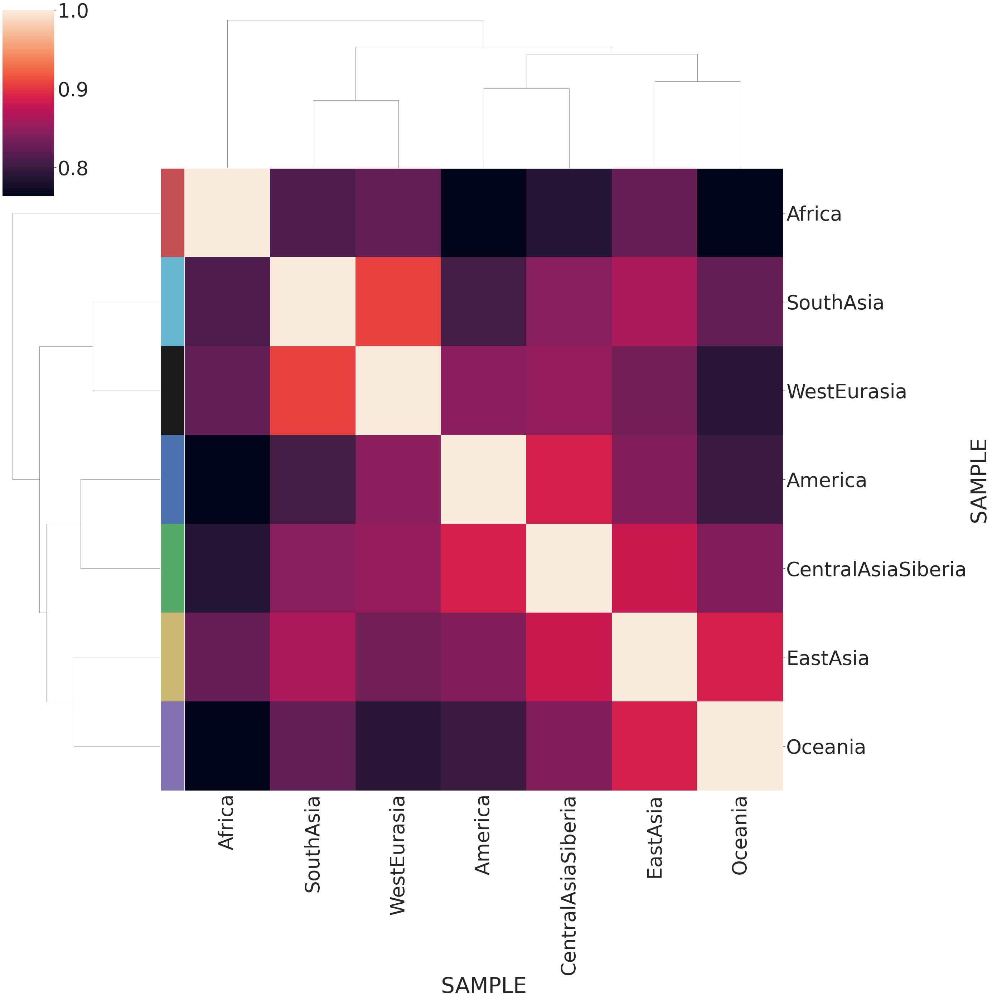

In [67]:
lut = dict(zip(df.columns.unique(), "rbgymck"))
lut

seaborn.set(font_scale=5)
corrmatrix = df.corr(method='pearson')
row_colors = df.columns.map(lut)
seaborn.clustermap(corrmatrix, row_colors=row_colors, row_cluster=True, figsize=(40,40))

In [68]:
freq = qdnaseq_pvt.iloc[:,3:283]
freq_input = freq.rename(columns=anotation['11-Country'])
df = freq_input.T
#df = df.reset_index()

#df.groupby('SAMPLE').count().div(df.groupby('SAMPLE').size(),0)


df = df.notnull().groupby(level=0).mean()

df

,0,1,2,3,4,5,6,7,8,9,...,1598,1599,1600,1601,1602,1603,1604,1605,1606,1607
SAMPLE,,,,,,,,,,,,,,,,,,,,,
Abkhazia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0
Argentina,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Armenia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Australia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Turkey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0
USA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Vietnam,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0


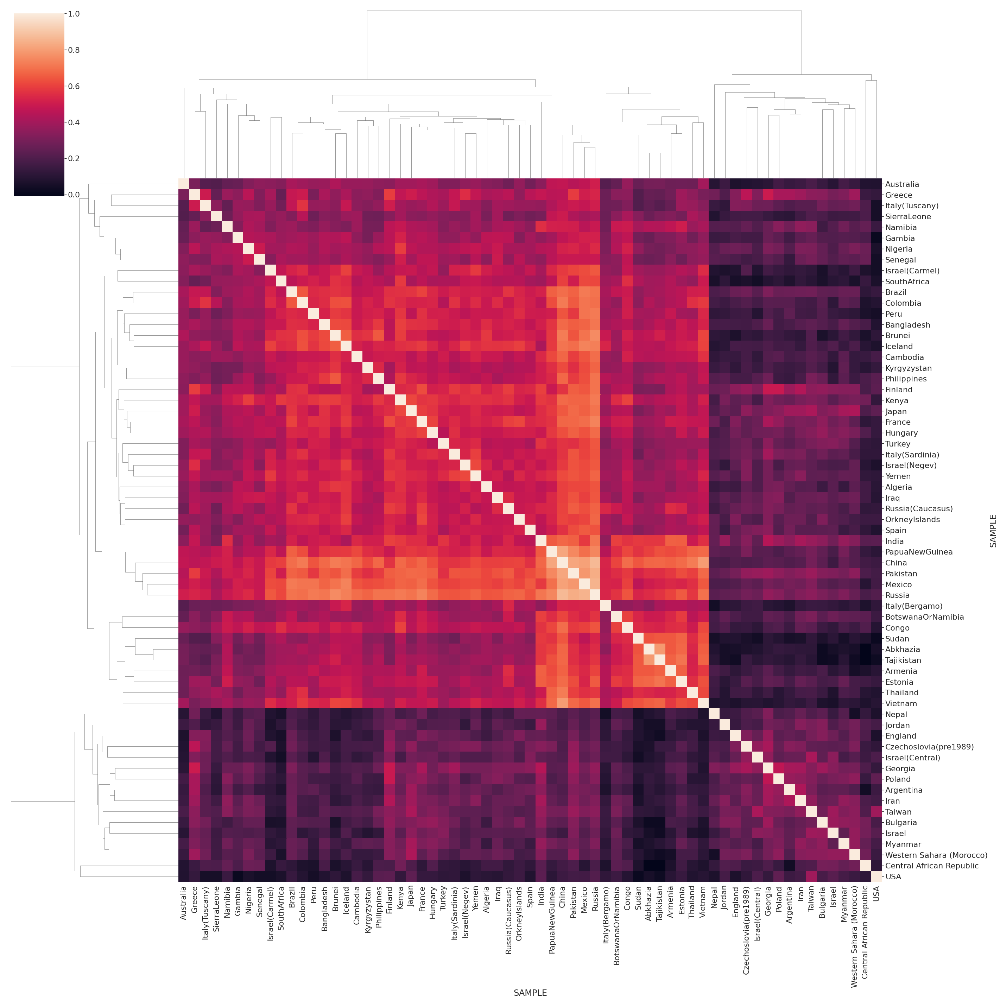

In [69]:
seaborn.set(font_scale=2)
corrmatrix = df.T.corr(method='pearson')
seaborn.clustermap(corrmatrix, figsize=(40,40))#, row_colors=row_colors, row_cluster=True, figsize=(40,40))


In [70]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]
final = qdnaseq_pvt.iloc[:,4:284]
counts = final
counts = counts.fillna(2)

#counts = counts[counts.columns.intersection(counts_a.columns)]

#counts = counts.drop(columns=['LP6005592-DNA_G03',
#                     'LP6005443-DNA_E10',
#                     'LP6005442-DNA_E04'])

counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,1598,1599,1600,1601,1602,1603,1604,1605,1606,1607
SAMPLE,,,,,,,,,,,,,,,,,,,,,
SAMEA3302611,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SAMEA3302612,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SAMEA3302613,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SAMEA3302614,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SAMEA3302615,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA3302904,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0
SAMEA3302906,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0
SAMEA3302908,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [71]:

#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 


,7-Gender,10-Region,11-Country
SAMEA3302611,F,EastAsia,China
SAMEA3302612,M,WestEurasia,Iran
SAMEA3302613,F,EastAsia,Vietnam
SAMEA3302614,F,EastAsia,China
SAMEA3302615,M,EastAsia,China
...,...,...,...
SAMEA3302904,F,America,Mexico
SAMEA3302906,F,EastAsia,Japan
SAMEA3302908,M,Oceania,USA
SAMEA3302911,M,SouthAsia,Nepal


<h2> PCA

In [72]:
#imputation and normalization 
#imp = SimpleImputer(missing_values=np.nan, strategy='median')
#X = imp.fit_transform(counts.T)
#X = StandardScaler().fit_transform(counts)


#PCA


#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
SAMEA3302611,F,EastAsia,China,1.580080,5.283465,4.212278,-0.212605,1.173703,1.851808,1.272336,-2.592967,-1.236550,1.276515
SAMEA3302612,M,WestEurasia,Iran,-4.257545,-0.644370,-0.956407,-1.339006,0.224023,1.204048,-0.367169,-0.378638,0.199227,-0.338569
SAMEA3302613,F,EastAsia,Vietnam,5.391728,1.550471,-0.510766,1.687789,-0.217687,-1.192184,-0.547959,-2.038055,0.182643,-0.549641
SAMEA3302614,F,EastAsia,China,0.495084,3.094712,3.552911,0.138432,3.873898,0.260332,0.585273,0.306901,-0.685413,-1.793472
SAMEA3302615,M,EastAsia,China,-4.119472,-0.633664,-0.389440,0.032603,0.769092,0.994249,0.985681,-0.069111,0.311597,-0.178226
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAMEA3302904,F,America,Mexico,0.913345,0.346991,-1.863900,0.110108,0.609139,0.261338,0.491521,0.206272,-0.341265,-0.602070
SAMEA3302906,F,EastAsia,Japan,5.182293,1.381858,-1.984274,1.234660,-0.680287,-1.373356,-0.893021,0.236703,1.177744,0.028378
SAMEA3302908,M,Oceania,USA,-4.025698,-0.914771,-1.141288,1.495967,2.240023,0.015631,-1.088011,-0.185452,-0.716602,0.236957
SAMEA3302911,M,SouthAsia,Nepal,-3.731387,-0.996428,-0.608105,-0.063087,1.437363,0.412593,1.299374,0.090262,-0.754511,-1.157929


In [73]:
pca.explained_variance_ratio_


array([0.22104106, 0.0537335 , 0.02741852, 0.01829433, 0.0157115 ,
       0.01533921, 0.01439091, 0.01343676, 0.01284089, 0.01193442])

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

/branchinecta/jbazanwilliamson/cnv_analysis/cnv_sgdp/scripts/pca_plot.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  tight_layout=True


            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495     0.069429   

             component_4  component_5

[244 rows x 12 columns]
Count of groups by factor: 7
            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China     1.580080     5.283465     4.212278   
WestEurasia        M       Iran    -4.257545    -0.644370    -0.956407   
EastAsia           F    Vietnam     5.391728     1.550471    -0.510766   
EastAsia           F      China     0.495084     3.094712     3.552911   
EastAsia           M      China    -4.119472    -0.633664    -0.389440   
...              ...        ...          ...          ...          ...   
America            F     Mexico     0.913345     0.346991    -1.863900   
EastAsia           F      Japan     5.182293     1.381858    -1.984274   
Oceania            M        USA    -4.025698    -0.914771    -1.141288   
SouthAsia          M      Nepal    -3.731387    -0.996428    -0.608105   
SouthAsia          M   Pakistan    -4.197855    -0.052495  

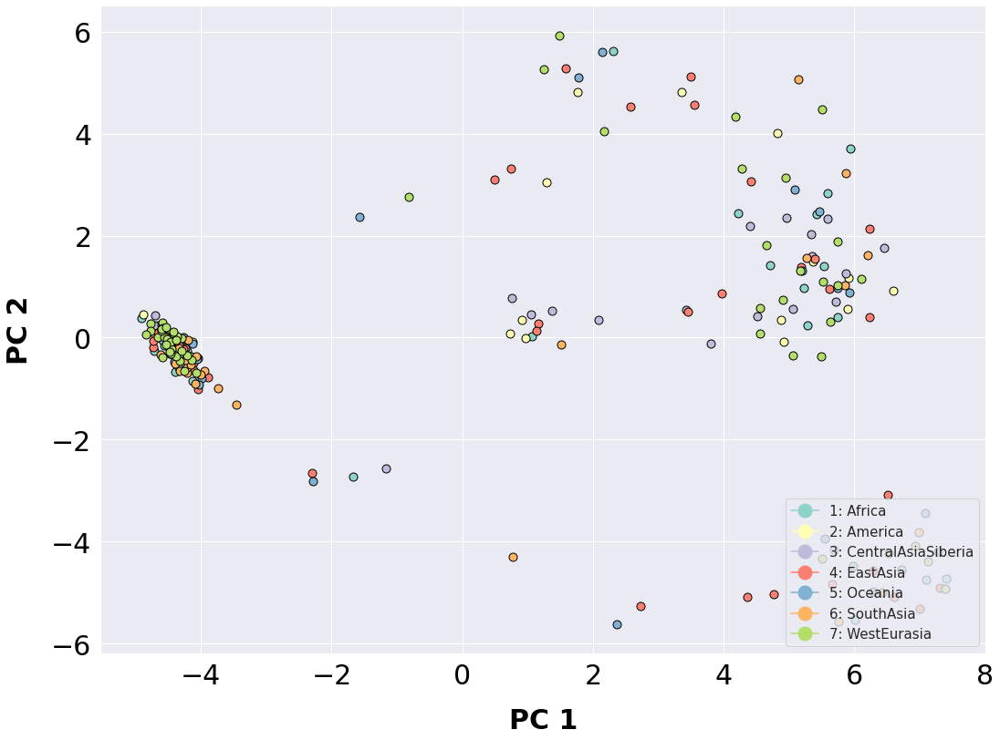

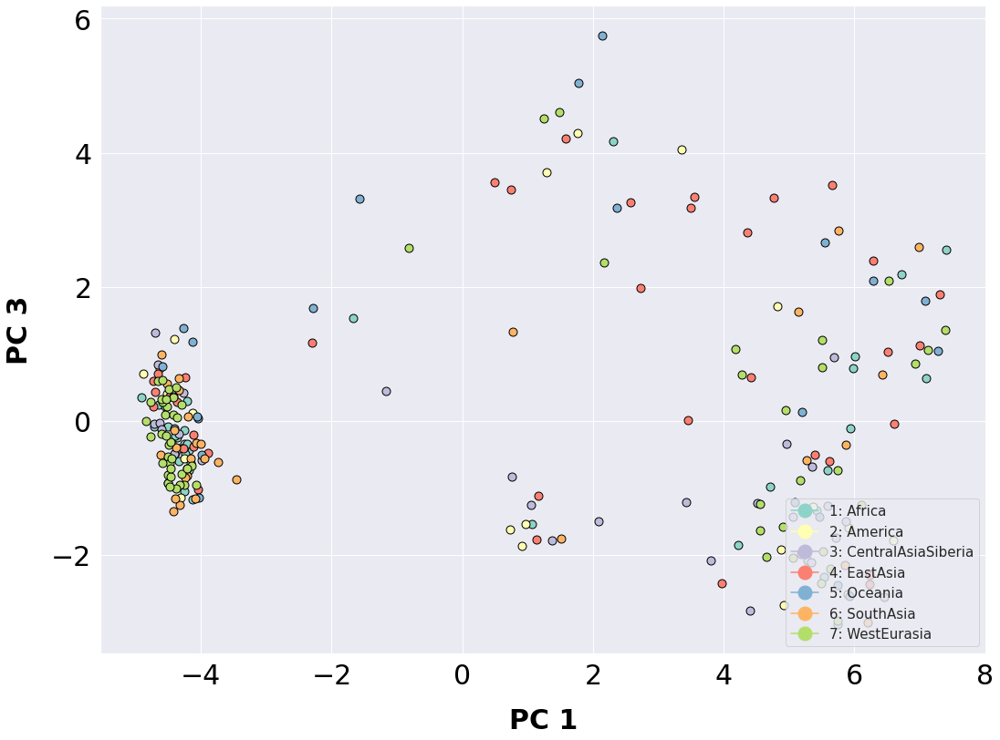

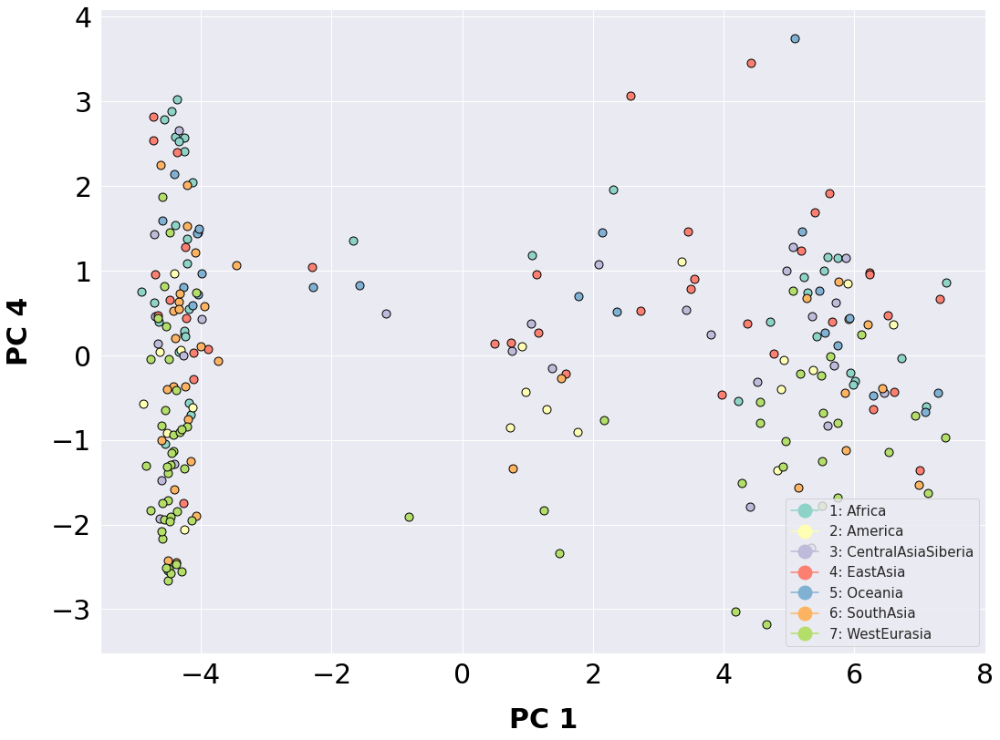

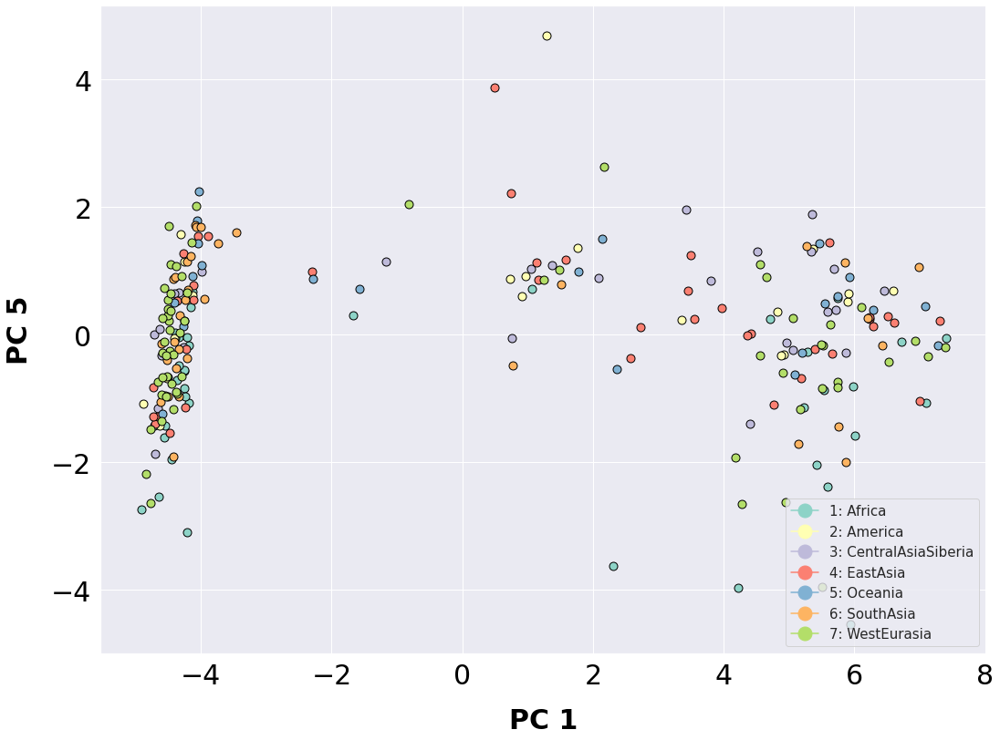

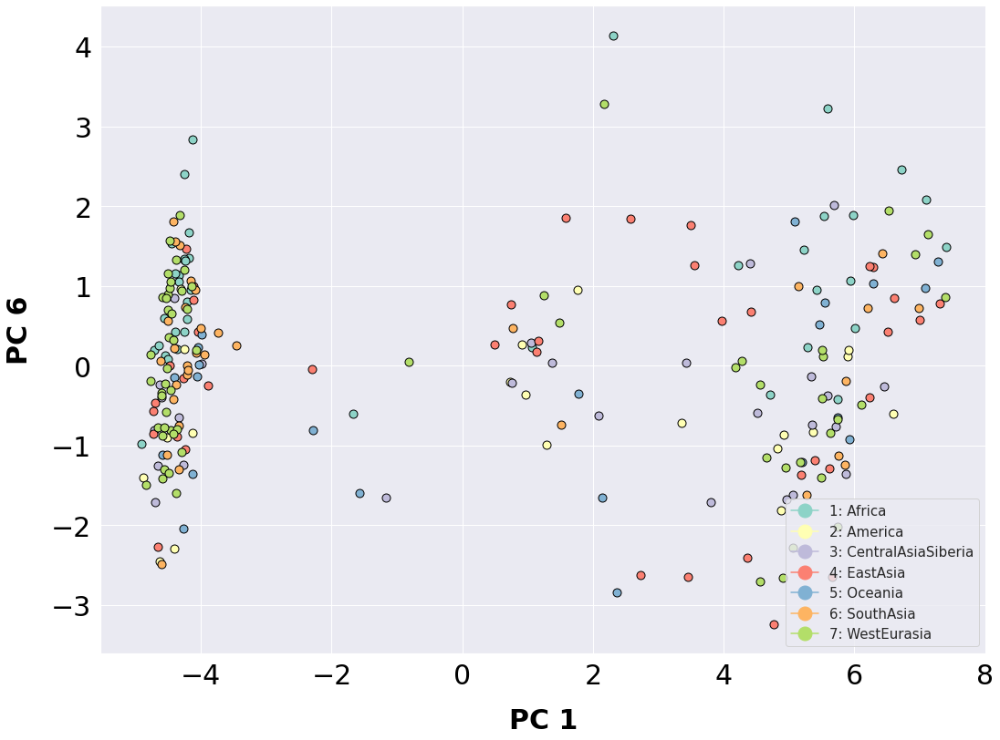

...

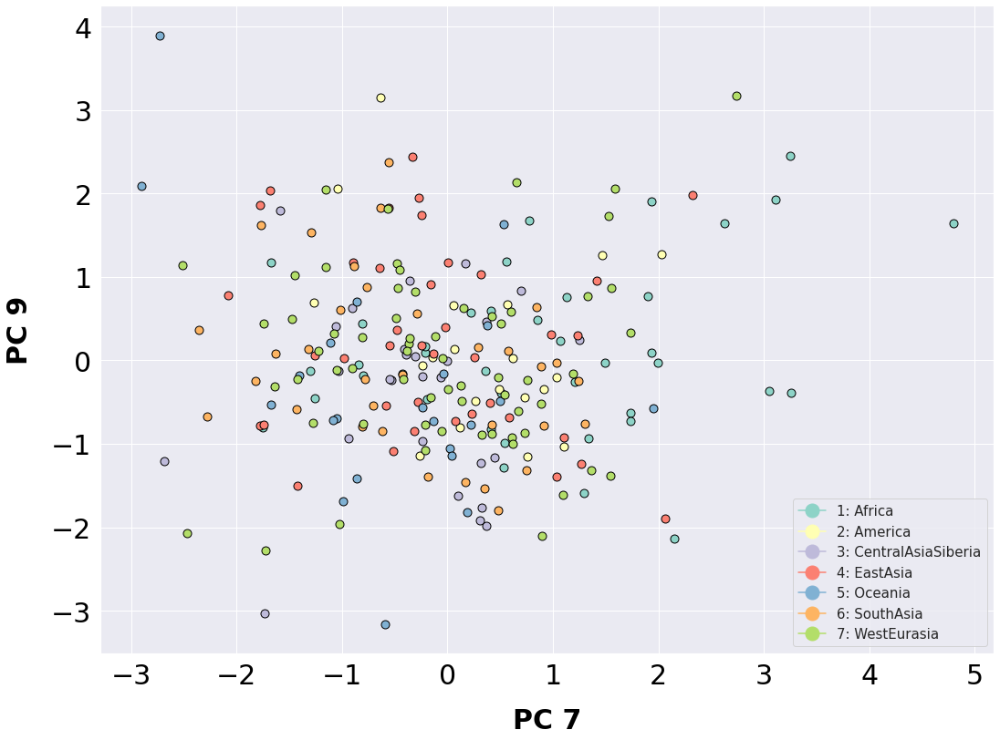

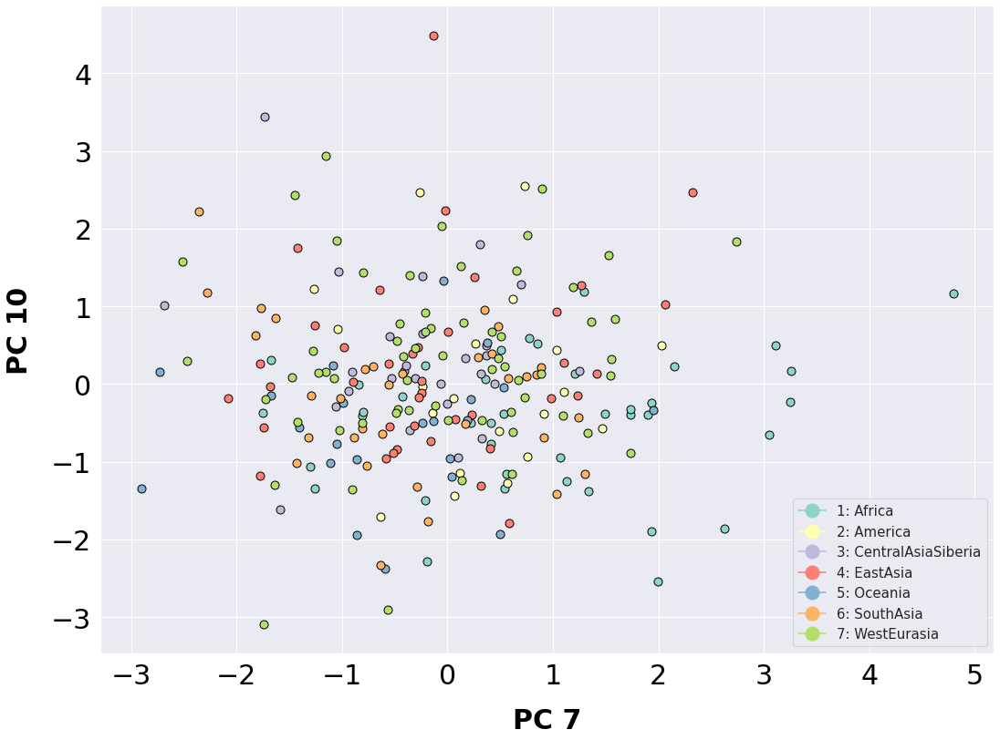

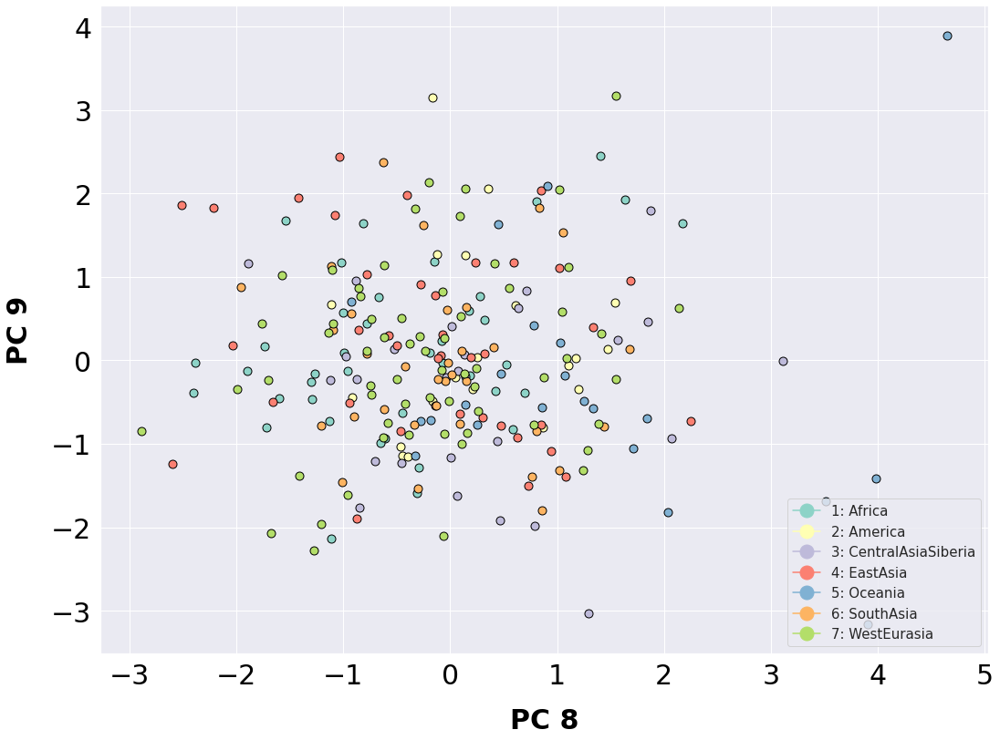

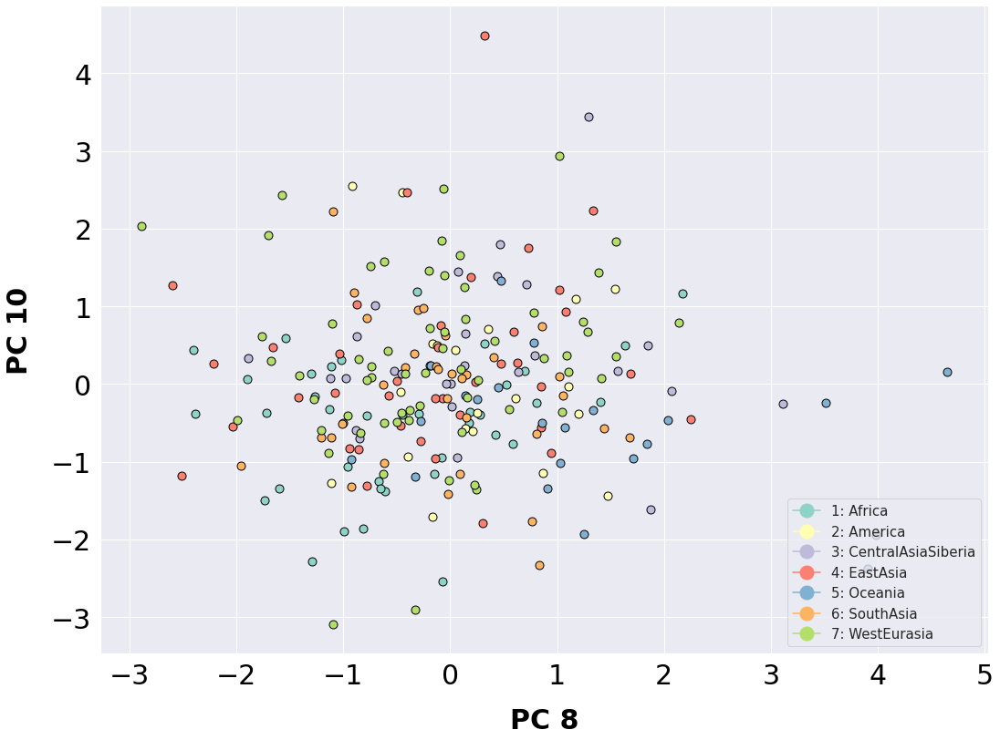

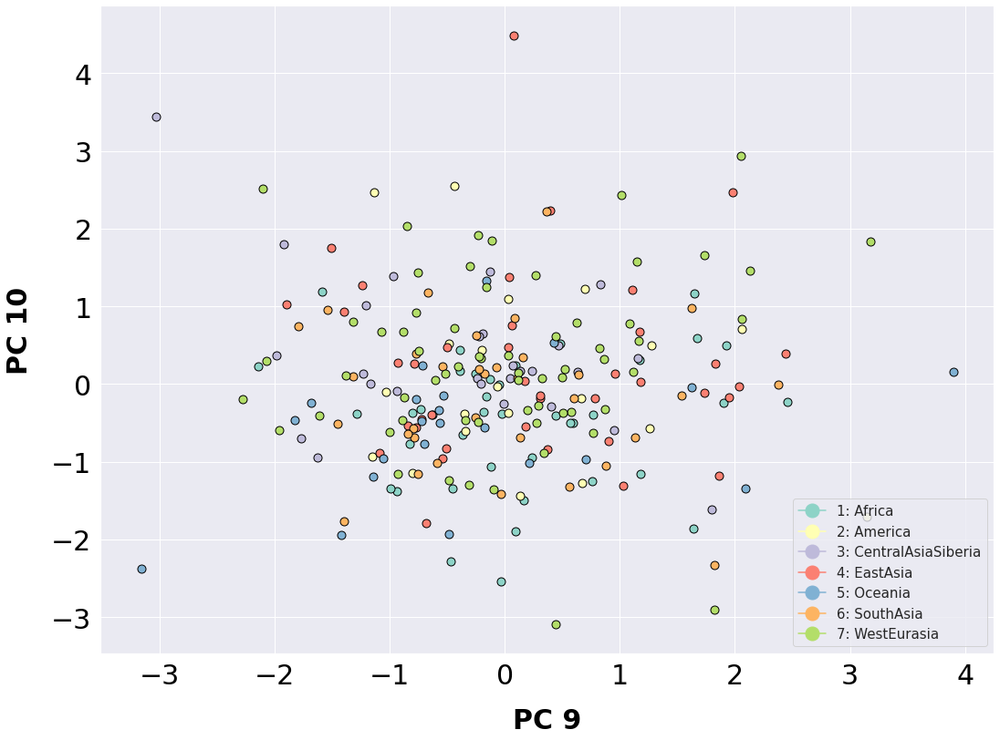

In [74]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China    -0.376193    -6.529474    -1.122016   
EastAsia           F    Vietnam     3.368838    -5.913963    -0.993306   
EastAsia           F      China    -0.844653    -3.956796    -0.276932   
SouthAsia          F   Pakistan     2.409368    -8.900346    -0.217269   
America            F   Colombia    -0.317183    -5.578220    -1.284078   
...              ...        ...          ...          ...          ...   
Africa             M    Namibia    14.444032     6.758651     0.924845   
America            F       Peru     5.825893    -6.370259    -1.656353   
WestEurasia        F     France     3.753813    -2.815281    -1.276378   
America            F     Mexico    -0.188785    -2.383837    -1.084652   
EastAsia           F      Japan     3.073486    -5.351326    -1.067801   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China    -0.376193    -6.529474    -1.122016   
EastAsia           F    Vietnam     3.368838    -5.913963    -0.993306   
EastAsia           F      China    -0.844653    -3.956796    -0.276932   
SouthAsia          F   Pakistan     2.409368    -8.900346    -0.217269   
America            F   Colombia    -0.317183    -5.578220    -1.284078   
...              ...        ...          ...          ...          ...   
Africa             M    Namibia    14.444032     6.758651     0.924845   
America            F       Peru     5.825893    -6.370259    -1.656353   
WestEurasia        F     France     3.753813    -2.815281    -1.276378   
America            F     Mexico    -0.188785    -2.383837    -1.084652   
EastAsia           F      Japan     3.073486    -5.351326    -1.067801   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China    -0.376193    -6.529474    -1.122016   
EastAsia           F    Vietnam     3.368838    -5.913963    -0.993306   
EastAsia           F      China    -0.844653    -3.956796    -0.276932   
SouthAsia          F   Pakistan     2.409368    -8.900346    -0.217269   
America            F   Colombia    -0.317183    -5.578220    -1.284078   
...              ...        ...          ...          ...          ...   
Africa             M    Namibia    14.444032     6.758651     0.924845   
America            F       Peru     5.825893    -6.370259    -1.656353   
WestEurasia        F     France     3.753813    -2.815281    -1.276378   
America            F     Mexico    -0.188785    -2.383837    -1.084652   
EastAsia           F      Japan     3.073486    -5.351326    -1.067801   

             component_4  component_5

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China    -0.376193    -6.529474    -1.122016   
EastAsia           F    Vietnam     3.368838    -5.913963    -0.993306   
EastAsia           F      China    -0.844653    -3.956796    -0.276932   
SouthAsia          F   Pakistan     2.409368    -8.900346    -0.217269   
America            F   Colombia    -0.317183    -5.578220    -1.284078   
...              ...        ...          ...          ...          ...   
Africa             M    Namibia    14.444032     6.758651     0.924845   
America            F       Peru     5.825893    -6.370259    -1.656353   
WestEurasia        F     France     3.753813    -2.815281    -1.276378   
America            F     Mexico    -0.188785    -2.383837    -1.084652   
EastAsia           F      Japan     3.073486    -5.351326    -1.067801   

             component_4  component_5

            7-Gender 11-Country  component_1  component_2  component_3  \
10-Region                                                                
EastAsia           F      China    -0.376193    -6.529474    -1.122016   
EastAsia           F    Vietnam     3.368838    -5.913963    -0.993306   
EastAsia           F      China    -0.844653    -3.956796    -0.276932   
SouthAsia          F   Pakistan     2.409368    -8.900346    -0.217269   
America            F   Colombia    -0.317183    -5.578220    -1.284078   
...              ...        ...          ...          ...          ...   
Africa             M    Namibia    14.444032     6.758651     0.924845   
America            F       Peru     5.825893    -6.370259    -1.656353   
WestEurasia        F     France     3.753813    -2.815281    -1.276378   
America            F     Mexico    -0.188785    -2.383837    -1.084652   
EastAsia           F      Japan     3.073486    -5.351326    -1.067801   

             component_4  component_5

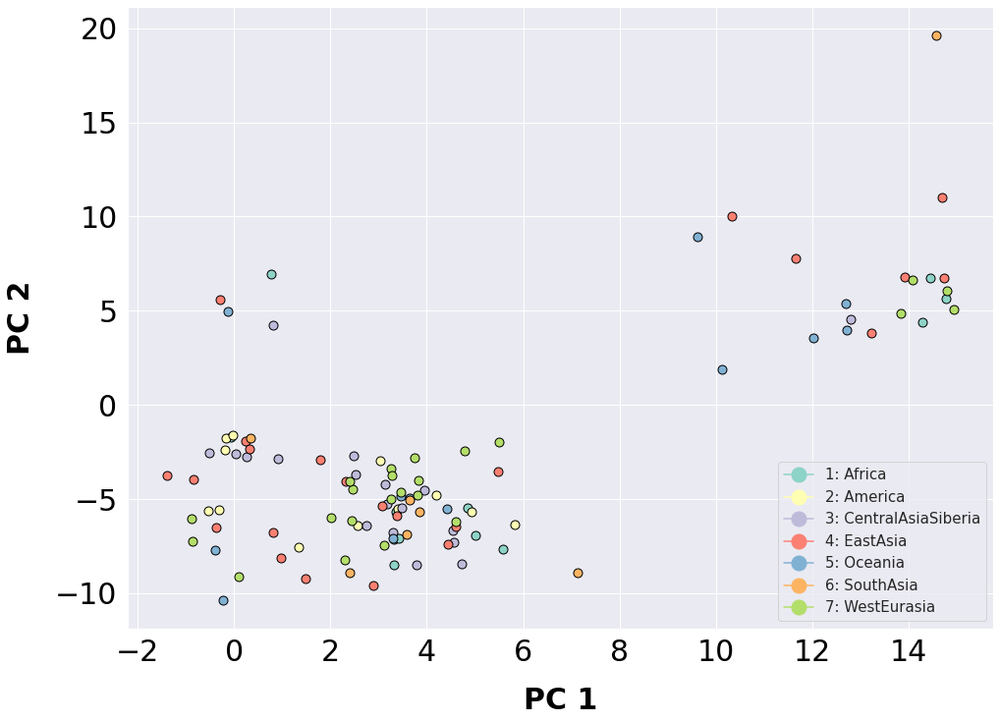

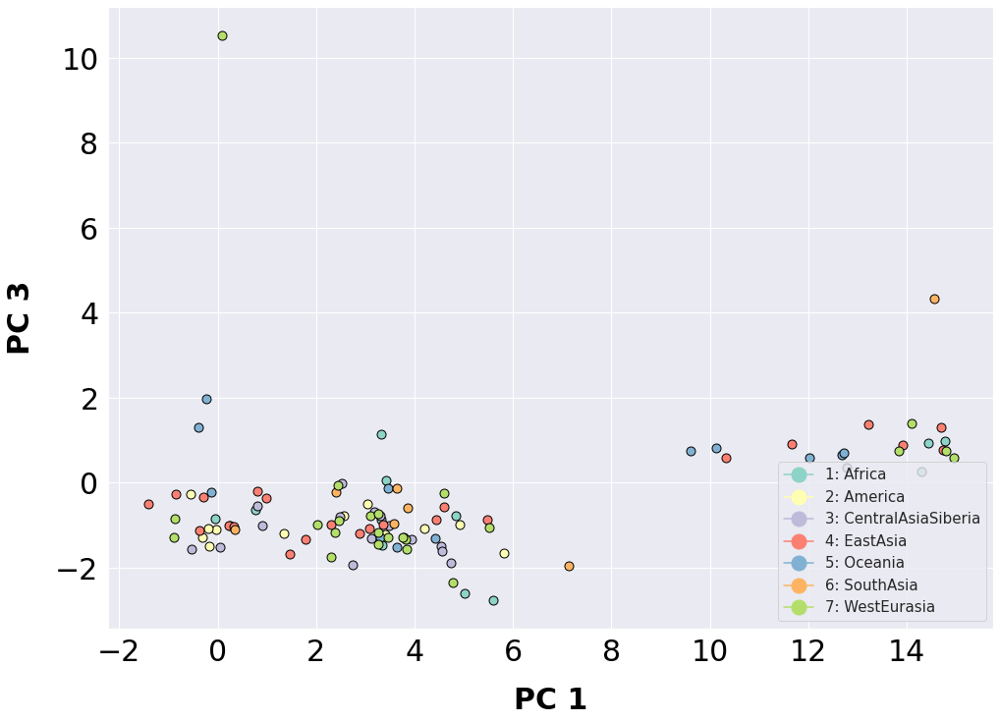

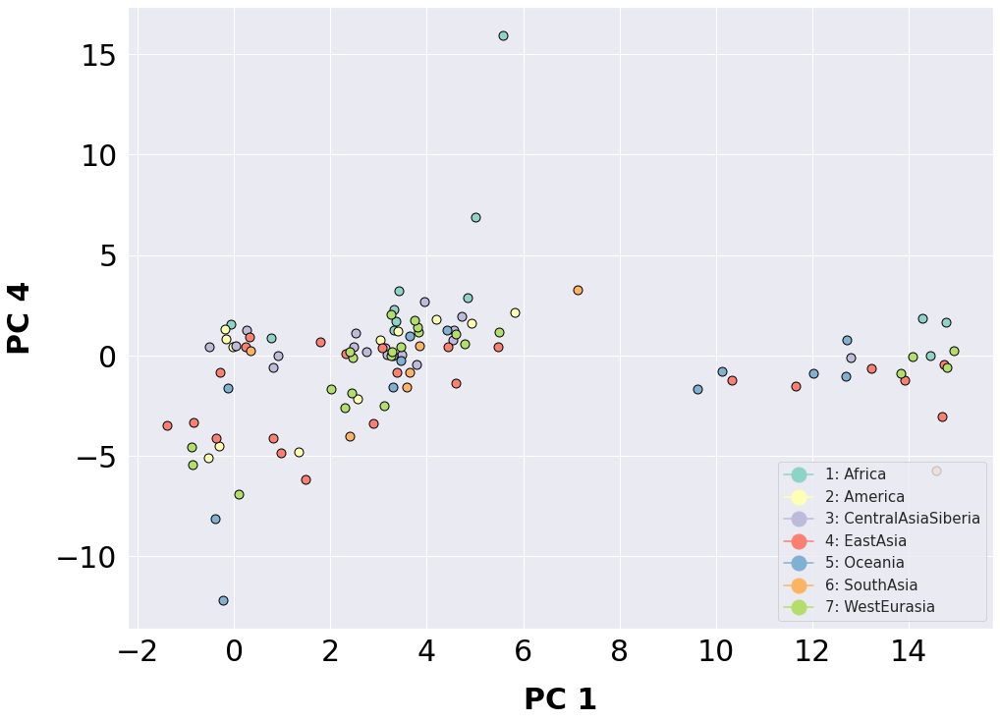

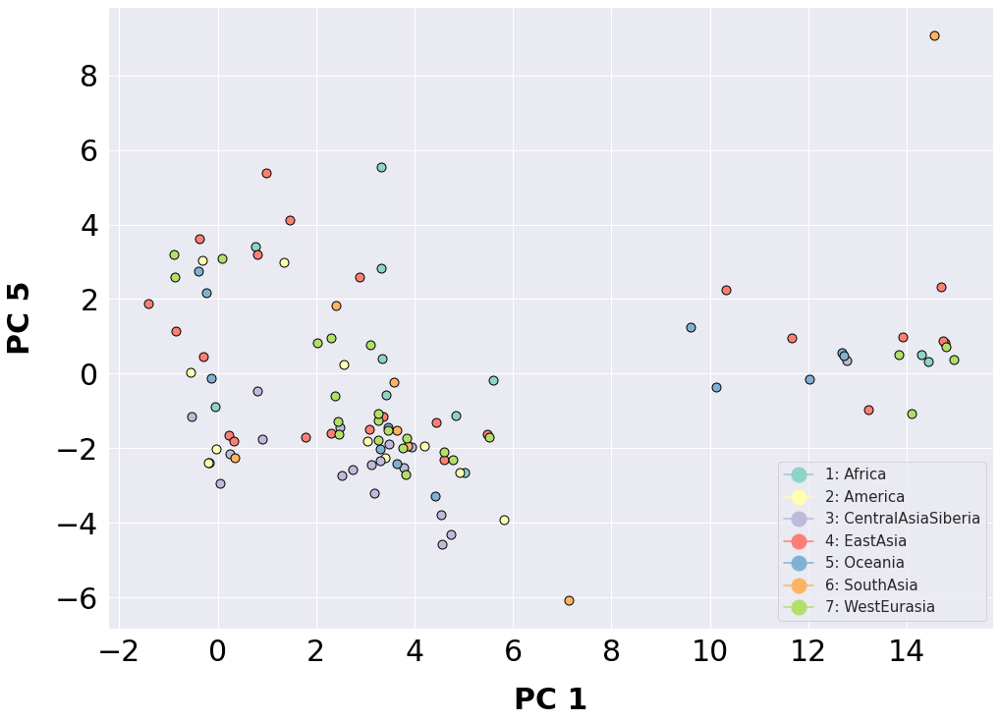

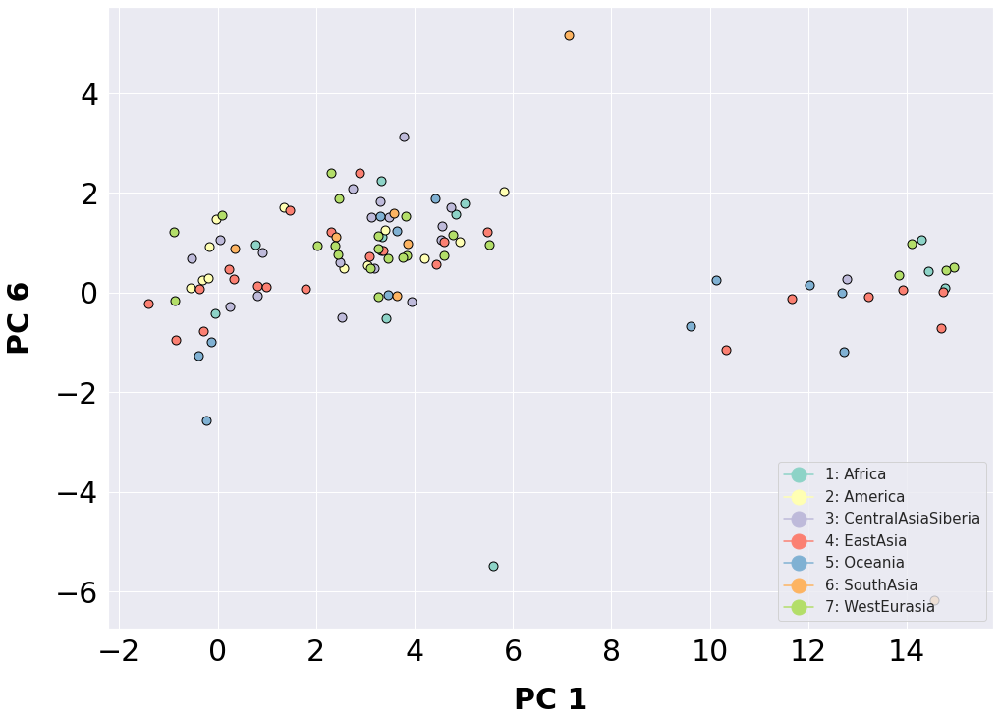

...

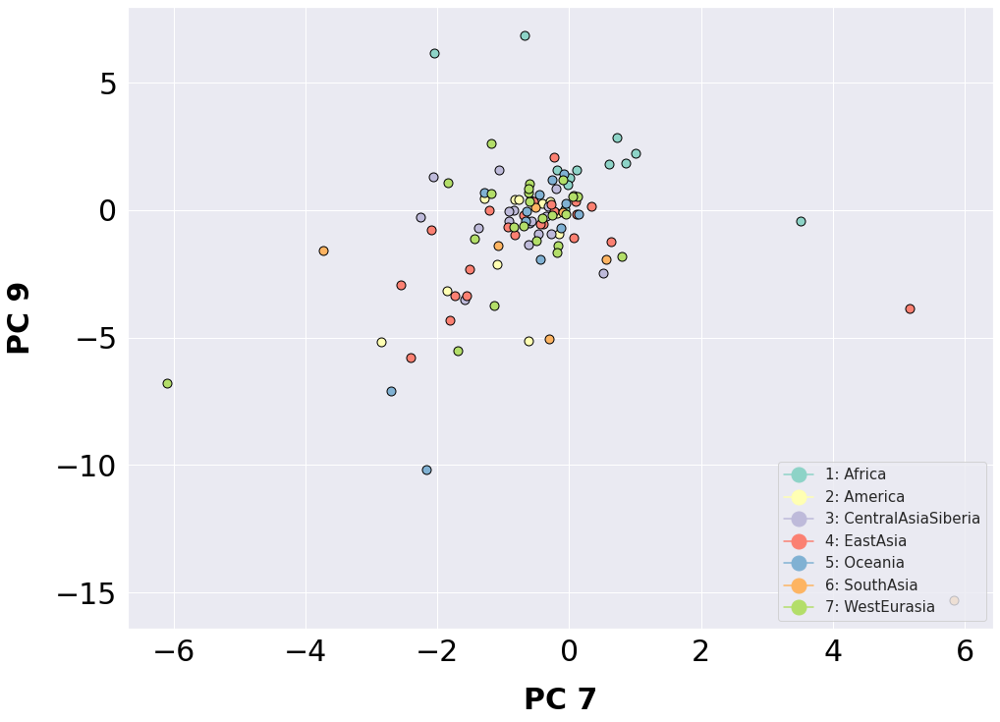

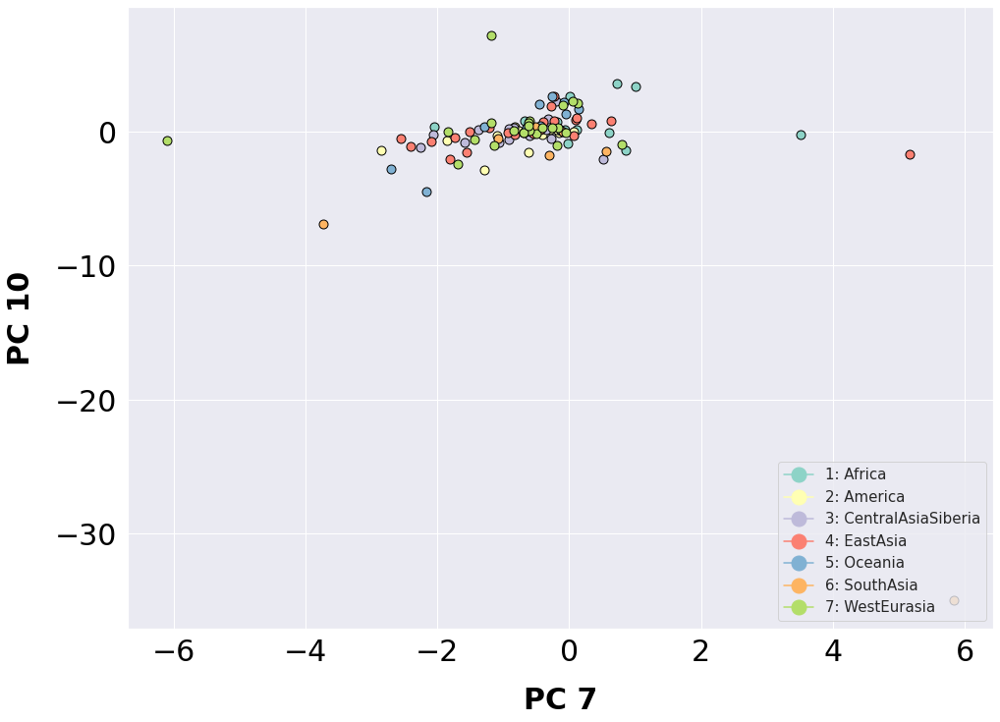

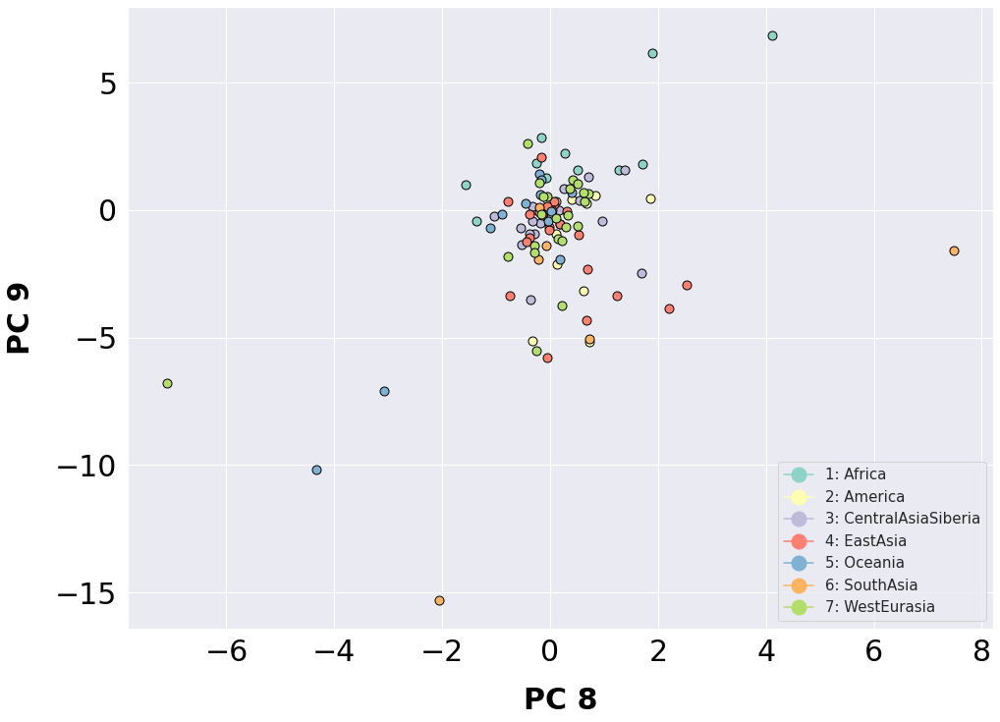

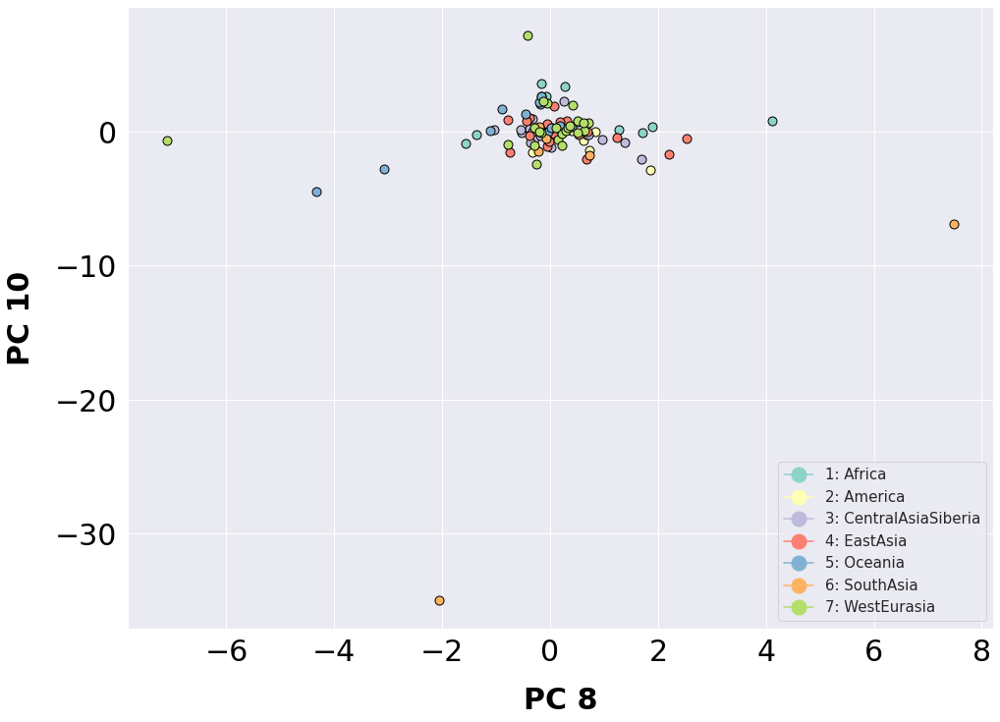

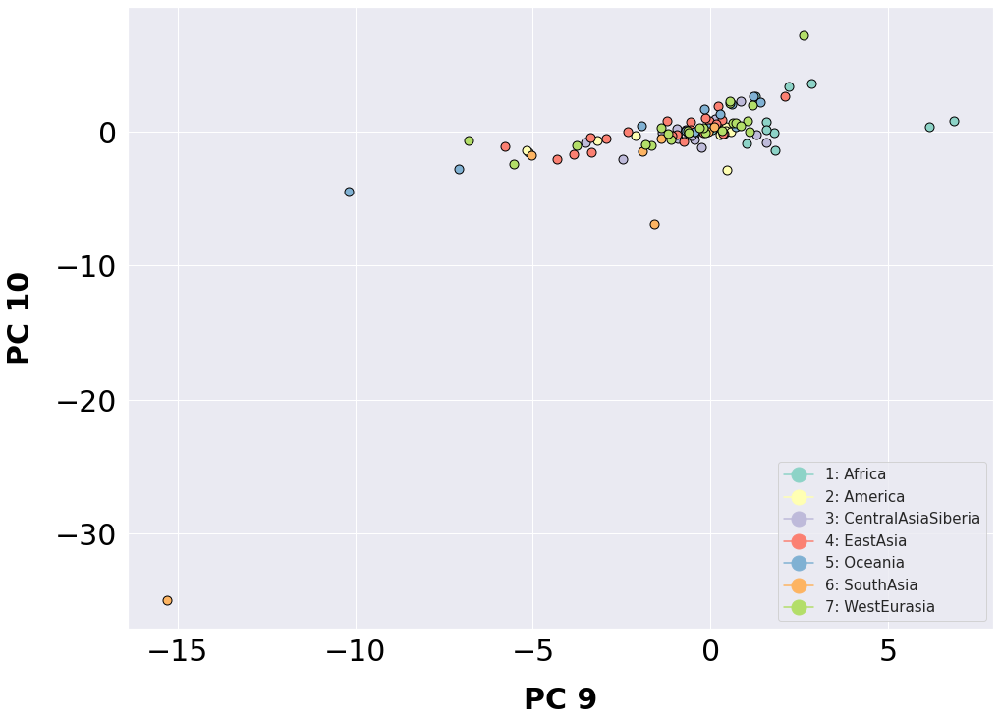

In [33]:
df_pca_outlier = df_pca[df_pca['component_1'] < 15]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_1'] > -1.5]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_2'] < 30]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_3'] < 30]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_4'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_5'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_6'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_7'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_8'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_9'] < 20]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_10'] < 20]


outliers = pd.concat([df_pca,df_pca_outlier]).drop_duplicates(keep=False)

outlier_samples = list(outliers.index)
outlier_samples

components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca_outlier, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

                   7-Gender      11-Country  component_1  component_2  \
10-Region                                                               
SouthAsia                 M           India    15.366956     5.392459   
EastAsia                  F           China    -0.328008    -6.014012   
EastAsia                  F         Vietnam     3.346154    -5.638243   
EastAsia                  F           China    -0.809184    -3.762632   
SouthAsia                 F        Pakistan     2.765132    -8.548249   
...                     ...             ...          ...          ...   
WestEurasia               F  Italy(Bergamo)     4.764859    -2.270902   
CentralAsiaSiberia        F          Russia     0.450937    -3.232399   
Africa                    M         Namibia    15.009114     5.759147   
CentralAsiaSiberia        F          Russia     3.863644    -4.319378   
America                   F          Mexico     3.212781    -3.692137   

                    component_3  component_4  comp

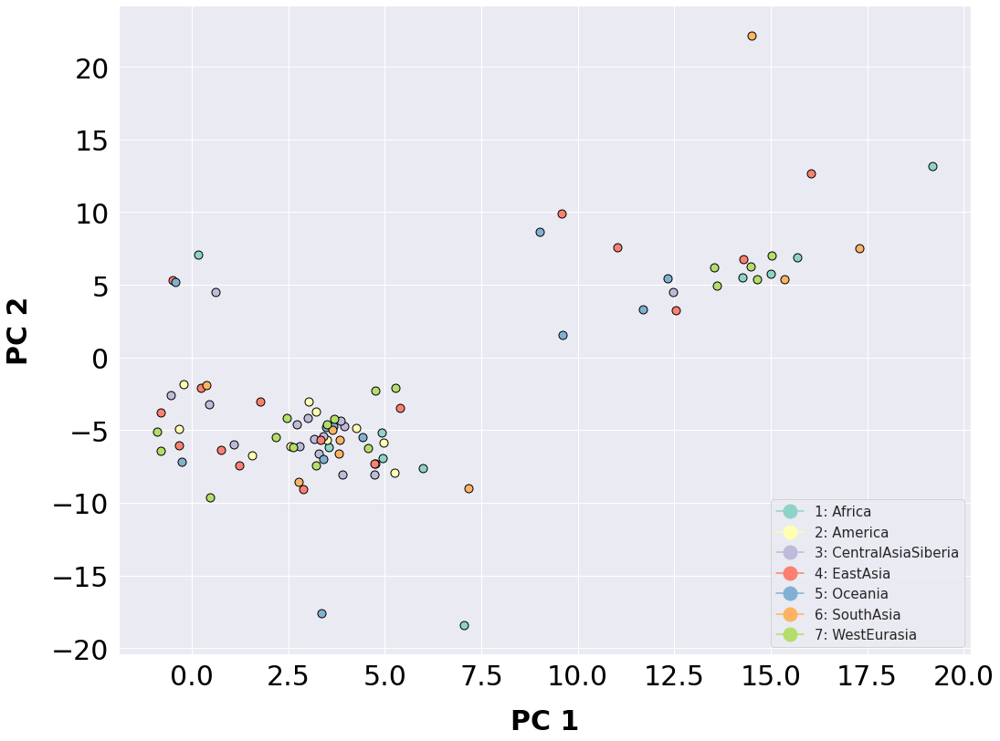

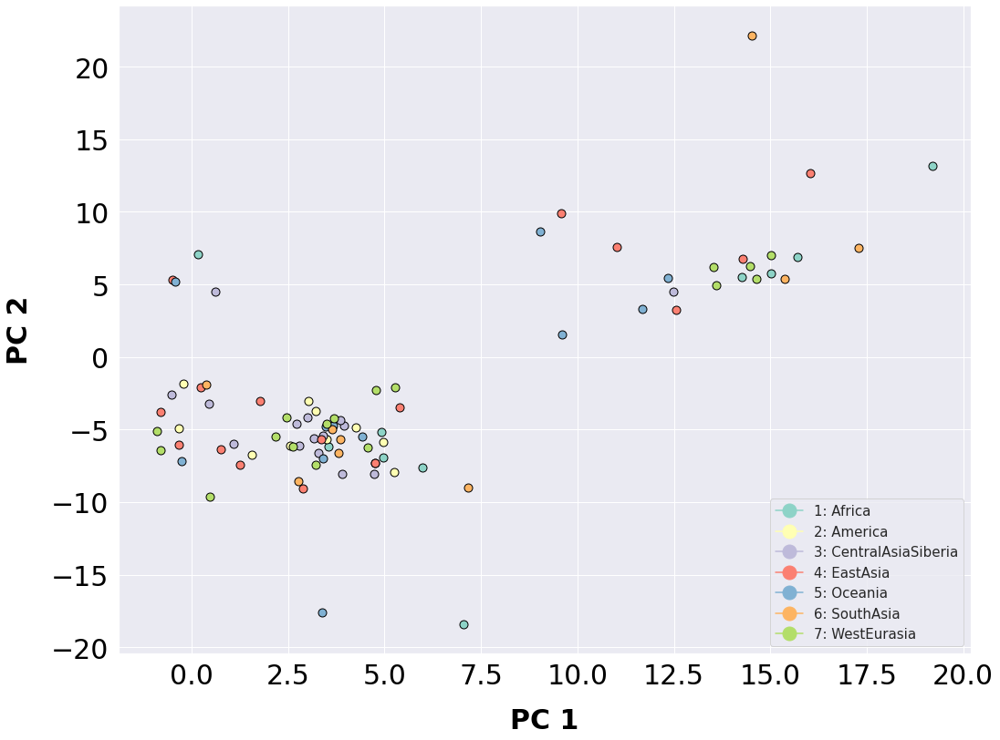

In [75]:
df_pca_outlier = df_pca[df_pca['component_1'] > -1.5]
df_pca_outlier = df_pca_outlier[df_pca_outlier['component_1'] < 20]
plot_scatter_cluster(data=df_pca_outlier, 
                     abscissa='component_1', 
                     ordinate='component_2', 
                     label_horizontal='PC 1', 
                     label_vertical='PC 2', 
                     factor='10-Region', 
                     fonts=define_font_properties(), 
                     colors=define_color_properties(), 
                     legend=True)
  

In [33]:
from Bio.Phylo.TreeConstruction import _Matrix
from Bio.Phylo.TreeConstruction import DistanceMatrix
from scipy.spatial.distance import pdist, squareform

#distance_matrix(np.array(counts))
distances = pdist(np.array(counts.T), metric='euclidean')
dist_matrix = squareform(distances)
dist_matrix.shape
#dist_matrix = dist_matrix.tolist()
#dist_matrix =np.tril(dist_matrix)
#dist_matrix = dist_matrix.tolist()
#np.triu(np.ones_like(dist_matrix))

dist_matrix

name =  list(counts.T.index)
matrix = dist_matrix
#m = _Matrix(names, matrix)
dist_matrix.shape

(245, 245)

In [34]:
from biotite.sequence.phylo import neighbor_joining
#track features for pca & tsne
features = features.sort_index()

#names.get_indices()
labels = list(counts.T.index)
labels = list(features['10-Region'])
tree = biotite.sequence.phylo.neighbor_joining(dist_matrix)
t = print(tree.to_newick(labels=labels, include_distance=False))
t#

(((((((WestEurasia,(WestEurasia,SouthAsia)),(SouthAsia,CentralAsiaSiberia)),((((WestEurasia,WestEurasia),(EastAsia,WestEurasia)),(CentralAsiaSiberia,America)),((((America,America),America),(Oceania,(Oceania,Oceania))),(CentralAsiaSiberia,CentralAsiaSiberia)))),((((EastAsia,Africa),WestEurasia),(WestEurasia,(WestEurasia,WestEurasia))),Africa)),((((WestEurasia,WestEurasia),WestEurasia),WestEurasia),WestEurasia)),(WestEurasia,WestEurasia)),((((WestEurasia,SouthAsia),(WestEurasia,WestEurasia)),((WestEurasia,SouthAsia),WestEurasia)),(((SouthAsia,(Africa,Africa)),Africa),((SouthAsia,EastAsia),(WestEurasia,WestEurasia)))),((((SouthAsia,SouthAsia),(Africa,(WestEurasia,WestEurasia))),(EastAsia,(((WestEurasia,WestEurasia),(CentralAsiaSiberia,(SouthAsia,(WestEurasia,WestEurasia)))),(CentralAsiaSiberia,WestEurasia)))),(((((((SouthAsia,SouthAsia),SouthAsia),(EastAsia,CentralAsiaSiberia)),(EastAsia,America)),((((((((((((((((((((EastAsia,((Africa,((EastAsia,Oceania),(Oceania,America))),(SouthAsia,Wes

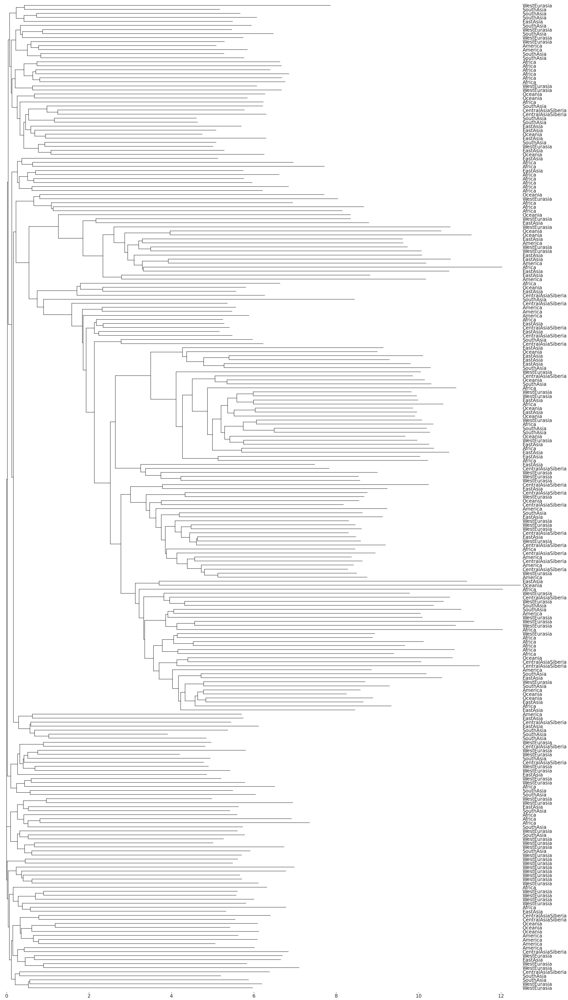

In [35]:
import biotite.sequence.graphics as graphics



row_colors = features['10-Region'].map(lut)

fig, ax = plt.subplots(figsize=(40.0, 70.0))
graphics.plot_dendrogram(ax, tree, labels=labels)
fig.tight_layout()
plt.savefig('neighbor-joining-tree.png')

In [79]:
#pd.set_option("display.max_rows", None, "display.max_columns", None)
heterozygous_deletions = qdnaseq_df[qdnaseq_df['TYPE'] == 1] 
heterozygous_deletions = heterozygous_deletions.groupby('SAMPLE').sum()
#heterozygous_deletions = heterozygous_deletions.set_index('SAMPLE')
#features = anotation.merge(count, left_index=True, right_index=True)
#features = features.loc[:,["7-Gender","10-Region", "11-Country"]]
#features = features.sort_index()
#features
heterozygous_deletions = features.merge(heterozygous_deletions, left_index=True, right_index=True)
heterozygous_deletions = heterozygous_deletions.reset_index()

#heterozygous_deletions.value_counts('SAMPLE').sort_index()
heterozygous_deletions

,index,7-Gender,10-Region,11-Country,START,END,SIZE,LOG2,TYPE
0,SAMEA3302610,M,SouthAsia,India,2364825032,2372370000,7545000,-55.74,32
1,SAMEA3302613,F,EastAsia,Vietnam,2383165027,2391460000,8295000,-33.68,27
2,SAMEA3302624,M,WestEurasia,Armenia,1957505028,1962390000,4885000,-51.14,28
3,SAMEA3302626,M,Oceania,PapuaNewGuinea,1714980037,1722575000,7595000,-1086.38,37
4,SAMEA3302627,F,America,Mexico,4937995059,4944880000,6885000,-3288.57,59
...,...,...,...,...,...,...,...,...,...
60,SAMEA3302840,F,EastAsia,China,2777130035,2784325000,7195000,-55.02,35
61,SAMEA3302846,M,EastAsia,China,1833205028,1837950000,4745000,-42.41,28
62,SAMEA3302855,F,WestEurasia,Italy(Bergamo),2065940036,2073030000,7090000,-49.94,36
63,SAMEA3302856,F,CentralAsiaSiberia,Russia,4916975056,4922960000,5985000,-2220.39,56


/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)

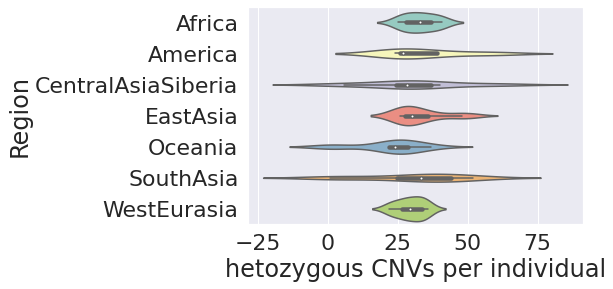

In [80]:
ax = sns.violinplot(x="TYPE", y="10-Region", data=heterozygous_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"])

ax.set_xlabel("hetozygous CNVs per individual")
ax.set_ylabel("Region")
plt.show()

In [81]:
#pd.set_option("display.max_rows", None, "display.max_columns", None)
biallelic_deletions = qdnaseq_df[qdnaseq_df['TYPE'] < 2 ] 
biallelic_deletions = biallelic_deletions.groupby('SAMPLE').size()

biallelic_deletions = pd.DataFrame(biallelic_deletions)
#biallelic_deletions = biallelic_deletions.set_index('SAMPLE')

biallelic_deletions = features.merge(biallelic_deletions, left_index=True, right_index=True)
#biallelic_deletions = biallelic_deletions.reset_index()

#heterozygous_deletions.value_counts('SAMPLE').sort_index()
biallelic_deletions.columns = ['7-Gender', '10-Region', '11-Country', 'TYPE']
biallelic_deletions

,7-Gender,10-Region,11-Country,TYPE
SAMEA3302610,M,SouthAsia,India,72
SAMEA3302611,F,EastAsia,China,47
SAMEA3302612,M,WestEurasia,Iran,17
SAMEA3302613,F,EastAsia,Vietnam,54
SAMEA3302614,F,EastAsia,China,39
...,...,...,...,...
SAMEA3302856,F,CentralAsiaSiberia,Russia,60
SAMEA3302858,M,Africa,Namibia,70
SAMEA3302862,F,CentralAsiaSiberia,Russia,41
SAMEA3302863,M,WestEurasia,Israel,34


/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/opt/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)

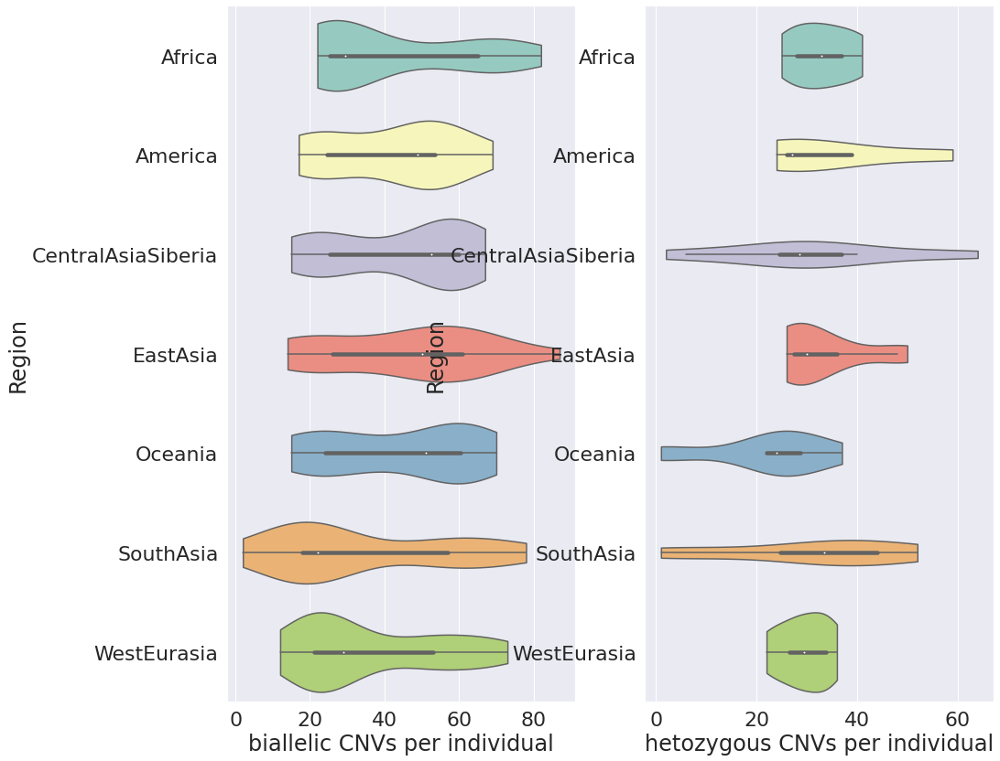

In [82]:
fig, axs = plt.subplots(1, 2, figsize=(15, 14))

ax = sns.violinplot(x="TYPE", y="10-Region", data=biallelic_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[0], cut=0)

ax.set_xlabel("biallelic CNVs per individual")
ax.set_ylabel("Region")

ax = sns.violinplot(x="TYPE", y="10-Region", data=heterozygous_deletions, palette='Set3', order=[ "Africa","America", "CentralAsiaSiberia","EastAsia", "Oceania", "SouthAsia", "WestEurasia"], ax=axs[1], cut=0)

ax.set_xlabel("hetozygous CNVs per individual")
ax.set_ylabel("Region")
plt.show()

In [42]:
def plot_scatter_cluster(
data=None,
abscissa=None,
ordinate=None,
label_horizontal=None,
label_vertical=None,
factor=None,
fonts=None,
colors=None,
legend=None,
):
    """
    Creates a figure of a chart of type histogram to represent the frequency
    distribution of a single series of values.
    arguments:
        data (object): Pandas data frame of groups, series, and values
        abscissa (str): name of data column with independent variable
        ordinate (str): name of data column with dependent variable
        label_horizontal (str): label for horizontal axis
        label_vertical (str): label for vertical axis
        factor (str): name of data column with groups or factors of samples
        fonts (dict<object>): references to definitions of font properties
        colors (dict<tuple>): references to definitions of color properties
        legend (bool): whether to include a legend for series on the chart
    raises:
    returns:
        (object): figure object
    """
##########
# Organize data.
# Separate points by groups.
# Define groups.
    data = data.copy(deep=True)
    data.set_index(
        factor,
append=False,
drop=True,
inplace=True
    )
    print(data)
    groups = data.groupby(level=[factor])
    print("Count of groups by factor: " + str(len(groups)))
    colors_series = list(seaborn.color_palette("Set3", n_colors=len(groups)))
##########
# Create figure.
    figure = matplotlib.pyplot.figure(
    figsize=(15.748, 11.811),
    tight_layout=True
    )
# Create axes.
    axes = matplotlib.pyplot.axes()
    axes.set_xlabel(
    xlabel=label_horizontal,
labelpad=20,
alpha=1.0,
backgroundcolor=colors["white"],
color=colors["black"],
fontproperties=fonts["properties"]["one"]
    )
    axes.set_ylabel(
        ylabel=label_vertical,
        labelpad=20,
        alpha=1.0,
        backgroundcolor=colors["white"],
        color=colors["black"],
        fontproperties=fonts["properties"]["one"]
    )
    axes.tick_params(
        axis="both",
        which="both",
        direction="out",
        length=5.0,
        width=3.0,
        color=colors["black"],
        pad=5,
        labelsize=fonts["values"]["one"]["size"],
        labelcolor=colors["black"]
    )
# Plot points for values from each group.
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        values_y = group[ordinate].to_list()
        handle = axes.plot(
            values_x,
            values_y,
linestyle="",
marker="o",
markersize=9,
markeredgecolor=colors["black"],#colors_series[index],
markerfacecolor=colors_series[index]
        )
        index += 1
        pass
# Plot labels for each group.
    labels = []
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        mean_x = statistics.median(values_x)
        values_y = group[ordinate].to_list()
        mean_y = statistics.median(values_y)
#        axes.text(
#            mean_x,
#            mean_y,
#str(index+1),
#backgroundcolor=colors["white_faint"],
#color=colors["black"],
#fontproperties=fonts["properties"]["three"],
#horizontalalignment="center",
#verticalalignment="center"
#        )
        label = str(index+1) + ": " + name
        labels.append(label)
        index += 1
        pass
# Create legend.
# Create custome elements for the legend
    elements = create_legend_elements(
colors=colors_series,
labels=labels
    )
    axes.legend(
handles=elements,
loc="lower right",
prop=fonts["properties"]["four"],
    )
    return figure


def define_font_properties():
    """
    Defines font properties.
    arguments:
    raises:
    returns:
        (dict<object>): references to definitions of font properties
    """
# Define font values.
    values_one = {
"family": "sans-serif",
"style": "normal",
"variant": "normal",
"stretch": 1000,
"weight": 1000,
"size": 30
    }
    values_two = {
"family": "sans-serif",
"style": "normal",
"variant": "normal",
"stretch": 500,
"weight": 1000,
"size": 25
    }
    values_three = {
"family": "sans-serif",
"style": "normal",
"variant": "normal",
"stretch": 500,
"weight": 1000,
"size": 20
    }
    values_four = {
"family": "sans-serif",
"style": "normal",
"variant": "normal",
"stretch": 500,
"weight": 500,
"size": 15
    }
# Define font properties.
    properties_one = matplotlib.font_manager.FontProperties(
family=values_one["family"],
style=values_one["style"],
variant=values_one["variant"],
stretch=values_one["stretch"],
weight=values_one["weight"],
size=values_one["size"]
    )
    properties_two = matplotlib.font_manager.FontProperties(
family=values_two["family"],
style=values_two["style"],
variant=values_two["variant"],
stretch=values_two["stretch"],
weight=values_two["weight"],
size=values_two["size"]
    )
    properties_three = matplotlib.font_manager.FontProperties(
family=values_three["family"],
style=values_three["style"],
variant=values_three["variant"],
stretch=values_three["stretch"],
weight=values_three["weight"],
size=values_three["size"]
    )
    properties_four = matplotlib.font_manager.FontProperties(
family=values_four["family"],
style=values_four["style"],
variant=values_four["variant"],
stretch=values_four["stretch"],
weight=values_four["weight"],
size=values_four["size"]
    )
# Compile and return references.
    return {
"values": {
"one": values_one,
"two": values_two,
"three": values_three,
"four": values_four
        },
"properties": {
"one": properties_one,
"two": properties_two,
"three": properties_three,
"four": properties_four
        }
    }



def define_color_properties():
    """
    Defines color properties.
    arguments:
    raises:
    returns:
        (dict<tuple>): references to definitions of color properties
    """
# Black.
    black = (0.0, 0.0, 0.0, 1.0)
# White.
    white = (1.0, 1.0, 1.0, 1.0)
    white_faint = (1.0, 1.0, 1.0, 0.75)
# Blue.
    blue = (0.0, 0.2, 0.5, 1.0)
    blue_faint = (0.0, 0.2, 0.5, 0.75)
# Orange.
    orange = (1.0, 0.6, 0.2, 1.0)
    orange_faint = (1.0, 0.6, 0.2, 0.75)
# Compile and return references.
    return {
"black": black,
"white": white,
"white_faint": white_faint,
"blue": blue,
"blue_faint": blue_faint,
"orange": orange,
"orange_faint": orange_faint
    }


def create_legend_elements(
colors=None,
labels=None,
):
    """
    Creates custom elements for legend.
    arguments:
        colors (list<dict>): colors
        labels (str): name of data column with independent variable
    raises:
    returns:
        (list<object>): elements for legend
    """
    elements = []
    for index in range(len(labels)):
        element = matplotlib.lines.Line2D(
            [0],
            [0],
            marker="o",
            color=colors[index],
            label=labels[index],
            markerfacecolor=colors[index],
            markersize=15,
        )
        elements.append(element)
    return elements